# Airbnb Price Optimization – Amsterdam Listings
---

### Project Objective  
Develop a **predictive pricing model** for Airbnb listings in Amsterdam that accounts for outliers, listing features, and market dynamics, enabling hosts to price their properties competitively and intelligently

---
###  Business Value  
- Help Airbnb hosts **optimize pricing** using data-backed insights  
- Reduce **underpricing/overpricing losses** through smart segmentation and error analysis  
- Improve host ROI by identifying **top features influencing price**  
- Deliver **Power BI dashboards** for quick business decision-making  

---

###  Project Highlights  
-  Analyzed over **9,600 listings** with **75+ features**  
-  Detected and handled **price outliers** using statistical segmentation  
-  Built and tuned **XGBoost** and **Random Forest** models for different price ranges  
-  Conducted **residual analysis and prediction error mapping**  
-  Implemented a **Segmented Modeling Strategy**:
  - **Segment A** (≤ usd557): High-volume listings with tight prediction bands  
  - **Segment B** (usd557+): Outliers and luxury listings needing advanced modeling  
-  Achieved best results in Segment A using **tuned XGBoost**  
- Exported data and predictions for **Power BI visualization**  
-  Attempted multiple models (SVR, Lasso, LightGBM, Gradient Boost) for Segment B  

---

###  Tools & Skills Demonstrated  
-  Data Cleaning & Feature Engineering (Pandas, NumPy)  
-  Encoding: Amenities, Dates, Reviews, Host Features  
-  Modeling: XGBoost, Random Forest, Decision Trees, AdaBoost, Lasso  
-  Hyperparameter Tuning: `RandomizedSearchCV`  
-  Evaluation Metrics: MAE, RMSE, R², Prediction Error Bands  
-  Segmented Strategy for improved business interpretability  
-  Power BI Dashboard with predicted vs. actual pricing trends  
- 💾Data Export & Integration for business presentation  





## Price-Specific Exploratory Data Analysis (See Separate Notebook)

Detailed price analysis including:
- Outlier detection and treatment
- Price range segmentation (normal vs. high-end listings)
- Distribution analysis, skew correction
- Bin-based breakdown for business insight
 View full price EDA here: `notebooks/Desktop/Airbnb_Price_Optimization/AirBnB_price_EDA.ipynb`


In [85]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

##### Uploading CSV 



In [84]:
df = pd.read_csv(r"C:\Users\parth\Desktop\Dhuwaraha\Big data\Data\listings_full.csv")
df.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,6.624170e+06,https://www.airbnb.com/rooms/6624170,2.024090e+13,9/5/2024,previous scrape,"Warm, cozy sunlighted downtown appt",2 room appt. 1.8 km from central station with ...,NaN,https://a0.muscache.com/pictures/df91da10-f7d4...,34670170,https://www.airbnb.com/users/show/34670170,Jeroen,5/31/2015,"Amsterdam, Netherlands",Im a happy person living in my cozy apartment ...,NaN,NaN,NaN,f,https://a0.muscache.com/im/users/34670170/prof...,https://a0.muscache.com/im/users/34670170/prof...,Oostelijke Eilanden en Kadijken,1,2,"['email', 'phone']",t,t,NaN,Centrum-Oost,NaN,52.36842,4.92438,Entire rental unit,Entire home/apt,3,NaN,1 bath,1.0,NaN,"[""Dishes and silverware"", ""Smoke alarm"", ""Hang...",NaN,2,1125,2.0,2.0,1125.0,1125.0,2.0,1125.0,NaN,t,0,0,0,0,9/5/2024,43,0,0,6/7/2015,2/16/2020,4.84,4.83,4.86,4.83,4.86,4.56,4.65,0363 3CF3 3233 3B24 6BEC,f,1,1,0,0,0.38
1,8.837071e+06,https://www.airbnb.com/rooms/8837071,2.024090e+13,9/5/2024,previous scrape,Cozy apartment in city center,Located in Amsterdam's sweet spot. A stone's t...,see the guide,https://a0.muscache.com/pictures/5fee12d4-61d0...,13034277,https://www.airbnb.com/users/show/13034277,Theo,3/11/2014,"Chicago, IL",NaN,NaN,NaN,NaN,f,https://a0.muscache.com/im/pictures/user/e569f...,https://a0.muscache.com/im/pictures/user/e569f...,Oud-West,1,1,"['email', 'phone']",t,f,"Amsterdam, Noord-Holland, Netherlands",De Baarsjes - Oud-West,NaN,52.36455,4.87712,Entire rental unit,Entire home/apt,2,NaN,1 bath,1.0,NaN,"[""Smoke alarm"", ""Essentials"", ""Iron"", ""Washer""...",NaN,2,1125,2.0,2.0,1125.0,1125.0,2.0,1125.0,NaN,NaN,0,0,0,0,9/5/2024,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0363 0C20 1768 FAAA 3556,f,1,1,0,0,NaN
2,7.161070e+05,https://www.airbnb.com/rooms/716107,2.024090e+13,9/5/2024,previous scrape,Loft style home nearby city centre,NaN,NaN,https://a0.muscache.com/pictures/9927048/b367a...,3689867,https://www.airbnb.com/users/show/3689867,Marijke,9/27/2012,"Amsterdam, Netherlands",We are Marijke Vos and Lars van Overbeek. We a...,within an hour,100%,100%,f,https://a0.muscache.com/im/users/3689867/profi...,https://a0.muscache.com/im/users/3689867/profi...,Oud-West,1,1,"['email', 'phone']",t,t,NaN,De Baarsjes - Oud-West,NaN,52.36462,4.86824,Entire rental unit,Entire home/apt,2,NaN,1 bath,1.0,NaN,"[""Smoke alarm"", ""Essentials"", ""Iron"", ""Host gr...",NaN,3,1125,2.0,3.0,1125.0,1125.0,2.4,1125.0,NaN,t,0,0,0,1,9/5/2024,172,8,4,1/3/2013,9/2/2024,4.71,4.82,4.64,4.78,4.83,4.66,4.61,0363 0014 1E57 F097 81A5,f,1,1,0,0,1.21
3,6.645390e+17,https://www.airbnb.com/rooms/664538756986273255,2.024090e+13,9/6/2024,previous scrape,Geweldige duurzame eco woonark op unieke plek!,This unique eco

In [4]:
pd.set_option('display.max_rows', None)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9659 entries, 0 to 9658
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            9659 non-null   float64
 1   listing_url                                   9659 non-null   object 
 2   scrape_id                                     9659 non-null   float64
 3   last_scraped                                  9659 non-null   object 
 4   source                                        9659 non-null   object 
 5   name                                          9659 non-null   object 
 6   description                                   9310 non-null   object 
 7   neighborhood_overview                         5469 non-null   object 
 8   picture_url                                   9659 non-null   object 
 9   host_id                                       9659 non-null   i

##### Selecting the Columns to have

In [5]:
pd.set_option('display.max_columns', None)
columns_to_keep = [
    'neighbourhood_cleansed', 'latitude', 'longitude', 'property_type', 'room_type', 'bedrooms',
    'accommodates', 'bathrooms_text', 'beds','amenities', 'host_is_superhost', 'host_identity_verified',
    'host_total_listings_count', 'availability_30', 'availability_60', 'availability_90', 'availability_365',
    'number_of_reviews', 'review_scores_rating','review_scores_accuracy',
    'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location',
    'review_scores_value', 'reviews_per_month', 'instant_bookable','minimum_nights', 'maximum_nights', 'price']
df_copy = df[columns_to_keep]
df_copy.head(4)


,neighbourhood_cleansed,latitude,longitude,property_type,room_type,bedrooms,accommodates,bathrooms_text,beds,amenities,host_is_superhost,host_identity_verified,host_total_listings_count,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,instant_bookable,minimum_nights,maximum_nights,price
0,Centrum-Oost,52.36842,4.92438,Entire rental unit,Entire home/apt,1.0,3,1 bath,NaN,"[""Dishes and silverware"", ""Smoke alarm"", ""Hang...",f,t,2,0,0,0,0,43,4.84,4.83,4.86,4.83,4.86,4.56,4.65,0.38,f,2,1125,NaN
1,De Baarsjes - Oud-West,52.36455,4.87712,Entire rental unit,Entire home/apt,1.0,2,1 bath,NaN,"[""Smoke alarm"", ""Essentials"", ""Iron"", ""Washer""...",f,f,1,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,2,1125,NaN
2,De Baarsjes - Oud-West,52.36462,4.86824,Entire rental unit,Entire home/apt,1.0,2,1 bath,NaN,"[""Smoke alarm"", ""Essentials"", ""Iron"", ""Host gr...",f,t,1,0,0,0,1,172,4.71,4.82,4.64,4.78,4.83,4.66,4.61,1.21,f,3,1125,NaN
3,Oud-Noord,52.39394,4.90587,Houseboat,Entire home/apt,2.0,3,1 bath,NaN,"[""Paid parking on premises"", ""Smoke alarm"", ""C...",f,t,4,0,0,0,0,1,5.00,5.00,5.00,5.00,5.00,5.00,5.00,0.04,f,3,21,NaN


## Business Context for Key Features

Before diving into data summaries and modeling, it's important to understand **why these features matter to pricing**.

This context helps connect your machine learning process to real-world business decisions that Airbnb hosts make daily.



### BUSINESS RELEVANCE OF KEY FEATURES:

1. PRICE: Target variable – represents nightly rate in EUR
2. LOCATION: Neighborhood is critical as it impacts attractiveness and accessibility
3. PROPERTY ATTRIBUTES: Bedrooms, bathrooms, accommodates – core pricing factors
4. HOST FEATURES: Superhost status, response time – influence trust and perceived value
5. REVIEWS: Higher review scores and count allow premium pricing with sustained demand
6. AMENITIES: Features like Wi-Fi, kitchen, workspace justify higher pricing tiers

 How can we predict the optimal price for a listing based on its characteristics?

#### Data Inspection

In [6]:
df_copy.shape

(9659, 30)

##### Summary of Numerical Columns

In [7]:
df_copy.describe()

,latitude,longitude,bedrooms,accommodates,beds,host_total_listings_count,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,minimum_nights,maximum_nights
count,9659.000000,9659.000000,9385.000000,9659.000000,5843.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,8632.000000,8632.000000,8631.000000,8632.000000,8632.000000,8632.000000,8632.000000,8632.000000,9659.000000,9659.000000
mean,52.366594,4.889761,1.563879,2.933741,1.794626,5.255306,4.911378,11.997826,20.825965,88.643338,45.636919,4.839924,4.855108,4.773125,4.889060,4.905074,4.807579,4.651705,1.074291,4.215343,320.719433
std,0.017328,0.035550,0.917526,1.356728,1.630312,50.986784,7.931826,17.300485,28.356808,116.173761,118.572029,0.256842,0.240081,0.319027,0.221975,0.217604,0.249365,0.321383,2.206133,19.845051,417.469795
min,52.290276,4.755870,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.010000,1.000000,1.000000
25%,52.355610,4.864693,1.000000,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,3.000000,4.780000,4.800000,4.670000,4.860000,4.890000,4.710000,4.520000,0.240000,2.000000,20.000000
50%,52.365569,4.887649,1.000000,2.000000,1.000000,1.000000,0.000000,2.000000,3.000000,22.000000,10.000000,4.920000,4.920000,4.870000,4.960000,5.000000,4.880000,4.700000,0.480000,3.000000,31.000000
75%,52.376405,4.909200,2.000000,4.000000,2.000000,2.000000,7.000000,19.000000,39.000000,158.000000,32.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,4.850000,1.020000,4.000000,365.000000
max,52.425159,5.026669,17.000000,16.000000,33.000000,1480.000000,30.000000,60.000000,90.000000,365.000000,4130.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,106.080000,1001.000000,1125.000000


##### Count of Missing Values

In [8]:
df_copy.isnull().sum()

neighbourhood_cleansed            0
latitude                          0
longitude                         0
property_type                     0
room_type                         0
bedrooms                        274
accommodates                      0
bathrooms_text                   10
beds                           3816
amenities                         0
host_is_superhost               110
host_identity_verified            0
host_total_listings_count         0
availability_30                   0
availability_60                   0
availability_90                   0
availability_365                  0
number_of_reviews                 0
review_scores_rating           1027
review_scores_accuracy         1027
review_scores_cleanliness      1028
review_scores_checkin          1027
review_scores_communication    1027
review_scores_location         1027
review_scores_value            1027
reviews_per_month              1027
instant_bookable                  0
minimum_nights              

#### Duplicate Data Handling

In [9]:
df_copy[df_copy.duplicated()]

,neighbourhood_cleansed,latitude,longitude,property_type,room_type,bedrooms,accommodates,bathrooms_text,beds,amenities,host_is_superhost,host_identity_verified,host_total_listings_count,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,instant_bookable,minimum_nights,maximum_nights,price
369,De Pijp - Rivierenbuurt,52.353368,4.907164,Room in hotel,Private room,1.0,2,1 private bath,NaN,"[""Air conditioning"", ""Gym"", ""Smoke alarm"", ""Pa...",f,t,6,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,1,365,NaN
5352,De Pijp - Rivierenbuurt,52.353368,4.907164,Room in hotel,Private room,1.0,2,1 private bath,NaN,"[""Air conditioning"", ""Gym"", ""Smoke alarm"", ""Pa...",f,t,6,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,1,365,NaN
6280,De Pijp - Rivierenbuurt,52.353368,4.907164,Room in hotel,Private room,1.0,2,1 private bath,NaN,"[""Air conditioning"", ""Gym"", ""Smoke alarm"", ""Pa...",f,t,6,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,1,365,NaN
7407,De Pijp - Rivierenbuurt,52.353368,4.907164,Room in hotel,Private room,1.0,2,1 private bath,NaN,"[""Air conditioning"", ""Gym"", ""Smoke alarm"", ""Pa...",f,t,6,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,1,365,NaN


In [10]:
df_copy = df_copy.drop_duplicates(keep = "first")

##### Feature Type Identification

In [11]:
numeric_features = [feature for feature in df_copy.columns if df_copy[feature].dtype != 'O']
categorical_features = [feature for feature in df_copy.columns if df_copy[feature].dtype == 'O']


print('We have {} numerical features : {}'.format(len(numeric_features), numeric_features))
print('\nWe have {} categorical features : {}'.format(len(categorical_features), categorical_features))

We have 21 numerical features : ['latitude', 'longitude', 'bedrooms', 'accommodates', 'beds', 'host_total_listings_count', 'availability_30', 'availability_60', 'availability_90', 'availability_365', 'number_of_reviews', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'reviews_per_month', 'minimum_nights', 'maximum_nights']

We have 9 categorical features : ['neighbourhood_cleansed', 'property_type', 'room_type', 'bathrooms_text', 'amenities', 'host_is_superhost', 'host_identity_verified', 'instant_bookable', 'price']


##### Analyzing Unique Values in Categorical Columns



In [12]:
for col in categorical_features:
    unique_values = df_copy[col].unique()
    count_unique = df_copy[col].nunique()
    print(f"Unique values in '{col}': {unique_values}")
    print(f"Number of unique values in '{col}': {count_unique}\n")

Unique values in 'neighbourhood_cleansed': ['Centrum-Oost' 'De Baarsjes - Oud-West' 'Oud-Noord' 'Westerpark'
 'Buitenveldert - Zuidas' 'Bos en Lommer' 'Zuid' 'Centrum-West' 'Oud-Oost'
 'IJburg - Zeeburgereiland' 'Oostelijk Havengebied - Indische Buurt'
 'De Pijp - Rivierenbuurt' 'Watergraafsmeer' 'Noord-West' 'Slotervaart'
 'Bijlmer-Oost' 'Gaasperdam - Driemond' 'Osdorp' 'Noord-Oost'
 'Bijlmer-Centrum' 'Geuzenveld - Slotermeer' 'De Aker - Nieuw Sloten']
Number of unique values in 'neighbourhood_cleansed': 22

Unique values in 'property_type': ['Entire rental unit' 'Houseboat' 'Room in boutique hotel' 'Entire condo'
 'Room in hotel' 'Private room in townhouse' 'Private room in rental unit'
 'Boat' 'Entire townhouse' 'Private room in bed and breakfast'
 'Private room in guesthouse' 'Entire loft' 'Private room in guest suite'
 'Entire home' 'Private room in condo' 'Private room in boat'
 'Entire serviced apartment' 'Entire guesthouse' 'Entire cottage'
 'Private room in home' 'Room in apar

## Handling Missing Values & Outliers

### Price
### Price-Specific Exploratory Data Analysis (See Separate Notebook)

#### Detailed price analysis including:

- Outlier detection and treatment
- Price range segmentation (normal vs. high-end listings)
- Distribution analysis, skew correction
- Bin-based breakdown for business insight View full price EDA here: notebooks/Desktop/Airbnb_Price_Optimization/AirBnB_price_EDA.ipynb

In this dataset, the price column is missing for over 3,000 rows out of a total of 9,659. When building a predictive model, it's generally better to remove rows with missing target values like price. Keeping them could lead to complications and inaccuracies during model training.

In [123]:
df_copy = df_copy.dropna(subset=['price'])
print(f"Number of rows after dropping NaN values in price: {len(df_copy)}")

Number of rows after dropping NaN values in price: 5817


In [14]:
df_copy.isnull().sum()

neighbourhood_cleansed           0
latitude                         0
longitude                        0
property_type                    0
room_type                        0
bedrooms                         6
accommodates                     0
bathrooms_text                   8
beds                            26
amenities                        0
host_is_superhost               64
host_identity_verified           0
host_total_listings_count        0
availability_30                  0
availability_60                  0
availability_90                  0
availability_365                 0
number_of_reviews                0
review_scores_rating           682
review_scores_accuracy         682
review_scores_cleanliness      682
review_scores_checkin          682
review_scores_communication    682
review_scores_location         682
review_scores_value            682
reviews_per_month              682
instant_bookable                 0
minimum_nights                   0
maximum_nights      

##### The price values were stored as strings with $ and , symbols, making them unusable for calculations or modeling. cleaned and converted them to float type for numerical analysis.

In [15]:
#$ sign and , replacing
df_copy['price'] = df_copy['price'].str.replace('$', '').str.replace(',', '') .str.strip().astype(float)
print(df_copy['price'].head())

10    269.0
31    254.0
32    203.0
33    375.0
34    599.0
Name: price, dtype: float64


In [16]:
numeric_features = [feature for feature in df_copy.columns if df_copy[feature].dtype != 'O']
categorical_features = [feature for feature in df_copy.columns if df_copy[feature].dtype == 'O']

print('We have {} numerical features'.format(len(numeric_features)))
print('\nWe have {} categorical features'.format(len(categorical_features)))

We have 22 numerical features

We have 8 categorical features


Below step gives us insight into the distribution and frequency of different prices. It helps identify outliers and unrealistic values that might affect the analysis or model performance.

In [17]:
price_counts = df_copy['price'].value_counts()

price_counts_df = price_counts.reset_index()
price_counts_df.columns = ['Price', 'Count']

price_counts_sorted = price_counts_df.sort_values(by='Price', ascending=False)

print(price_counts_sorted)

       Price  Count
497  91466.0      1
523  10000.0      1
466   7051.0      1
512   5000.0      1
441   3000.0      2
526   2685.0      1
539   2500.0      1
597   2250.0      1
490   2000.0      1
484   1995.0      1
447   1900.0      1
503   1819.0      1
540   1785.0      1
517   1771.0      1
529   1689.0      1
600   1650.0      1
456   1625.0      1
435   1600.0      2
465   1576.0      1
449   1560.0      1
563   1557.0      1
596   1542.0      1
577   1535.0      1
354   1500.0      3
454   1429.0      1
579   1399.0      1
548   1366.0      1
543   1350.0      1
556   1329.0      1
486   1300.0      1
423   1250.0      2
524   1226.0      1
350   1200.0      3
592   1150.0      1
493   1136.0      1
392   1100.0      2
508   1090.0      1
535   1060.0      1
519   1050.0      1
475   1045.0      1
545   1036.0      1
468   1021.0      1
483   1011.0      1
615   1005.0      1
200   1000.0      8
437    999.0      2
470    994.0      1
574    979.0      1
398    975.0      2


To reduce the impact of outlier prices (e.g., listings above $3000), we applied a cutoff. These extreme values can skew the distribution and reduce model accuracy, especially in price prediction tasks.

In [18]:
threshold = 1000
df_copy = df_copy[df_copy['price'] <= threshold]
df_copy.head()

,neighbourhood_cleansed,latitude,longitude,property_type,room_type,bedrooms,accommodates,bathrooms_text,beds,amenities,host_is_superhost,host_identity_verified,host_total_listings_count,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,instant_bookable,minimum_nights,maximum_nights,price
10,Centrum-West,52.370110,4.879090,Room in hotel,Private room,1.0,3,1 bath,3.0,"[""Paid parking on premises"", ""Body soap"", ""Cof...",f,t,9,23,42,58,323,8,4.75,5.00,4.88,4.75,4.50,4.88,4.75,0.37,t,1,365,269.0
31,De Baarsjes - Oud-West,52.359452,4.861793,Private room in bed and breakfast,Private room,2.0,4,1 private bath,5.0,"[""Dishes and silverware"", ""Fast wifi \u2013 98...",t,t,2,1,9,35,275,165,4.92,4.87,4.85,4.99,4.98,4.93,4.62,4.37,t,4,365,254.0
32,IJburg - Zeeburgereiland,52.356197,4.991435,Private room in guesthouse,Private room,2.0,4,1.5 baths,2.0,"[""Dishes and silverware"", ""Toaster"", ""Shower g...",t,t,2,6,10,10,10,140,4.92,4.84,4.93,4.97,4.99,4.91,4.74,1.11,f,3,30,203.0
33,De Baarsjes - Oud-West,52.367664,4.851357,Entire loft,Entire home/apt,2.0,4,2 baths,2.0,"[""Paid parking on premises"", ""Smoke alarm"", ""L...",f,t,5,4,29,59,60,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,3,365,375.0
34,Centrum-West,52.372422,4.882609,Entire condo,Entire home/apt,1.0,2,1 bath,1.0,"[""Dishes and silverware"", ""Toaster"", ""Shower g...",f,t,1,0,0,0,247,14,4.93,4.86,4.86,5.00,5.00,4.93,4.71,0.56,f,3,10,599.0


#### Visualizing Cleaned Price Distribution

##### 1. Histogram – To See Overall Price Distribution

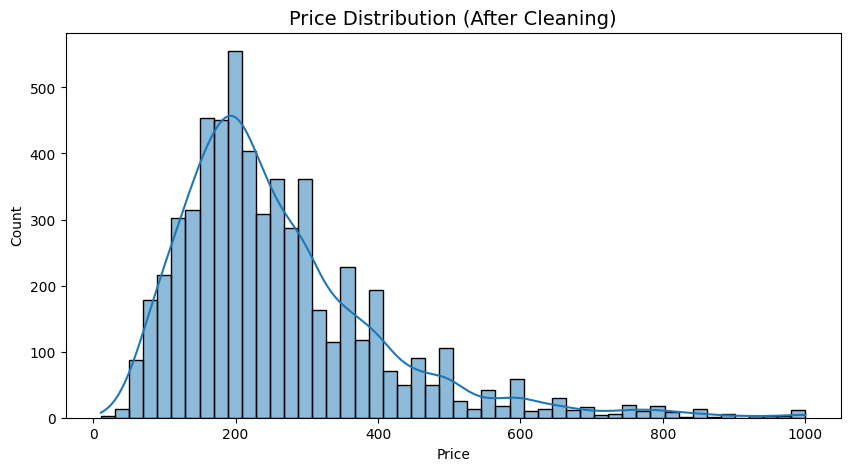

In [19]:
plt.figure(figsize=(10, 5))
sns.histplot(df_copy['price'], bins=50, kde=True)
plt.title("Price Distribution (After Cleaning)", fontsize=14)
plt.xlabel("Price")
plt.ylabel("Count")
plt.show()


- The histogram shows that the majority of Airbnb listings are priced between 50 and 300.
-The distribution is right-skewed, meaning a small number of listings have much higher prices (closer to 1000 or even up to 3000).
-This confirms that while most listings are affordable, some luxury or premium listings still exist in the dataset.
-The 3000 threshold helped reduce extreme outliers, but a few mild outliers are still visible on the far right, which is typical in real-world pricing data.
-The peak around $150–$250 indicates the most common price range.

##### 2. Boxplot – To Detect Remaining Outliers Visually

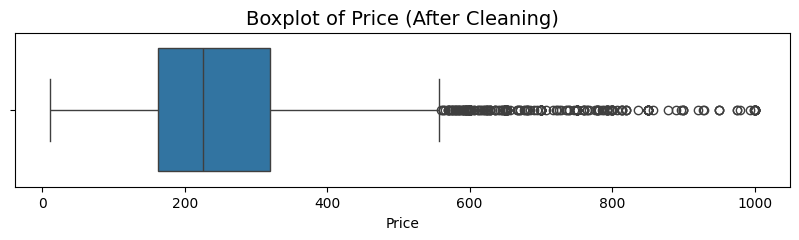

In [20]:
plt.figure(figsize=(10, 2))
sns.boxplot(x=df_copy['price'])
plt.title("Boxplot of Price (After Cleaning)", fontsize=14)
plt.xlabel("Price")
plt.show()


- The boxplot reveals that while most Airbnb listings fall below 500, there are many outliers beyond this range, extending up to 3000.
- The box represents the interquartile range (IQR)—the middle 50% of listings—mostly between 100 and 300.
- The horizontal line inside the box is the median price, showing where half the listings are cheaper and half are more expensive.
- The dots beyond the whiskers are outliers, indicating higher-priced listings that are much less frequent.
- Even after applying the $3000 threshold, the data remains right-skewed, which is typical in real-world pricing.

### Review scores

When a group of related columns, like the review_scores_*, have the same missing entries, it's crucial to evaluate whether the missingness is systematic (e.g., some hosts never received any reviews) or random. Here's how to handle this:

In [21]:
print(df_copy.columns)


Index(['neighbourhood_cleansed', 'latitude', 'longitude', 'property_type',
       'room_type', 'bedrooms', 'accommodates', 'bathrooms_text', 'beds',
       'amenities', 'host_is_superhost', 'host_identity_verified',
       'host_total_listings_count', 'availability_30', 'availability_60',
       'availability_90', 'availability_365', 'number_of_reviews',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'reviews_per_month', 'instant_bookable',
       'minimum_nights', 'maximum_nights', 'price'],
      dtype='object')


#####  1: Understanding the Pattern of Missing Review Scores

In [22]:
print(df_copy[df_copy['number_of_reviews'] == 0]['review_scores_rating'].isnull().all())


True


- it confirms that all missing values in the review_scores_* columns are systematically tied to listings with number_of_reviews == 0. These are likely listings that have never received any reviews.
- Since these rows represent listings with no reviews, you can impute the review_scores_* columns with a default value, such as 0, to explicitly indicate "no reviews available." This prevents these rows from being excluded while ensuring the model interprets them correctly.
- The missing values in reviews_per_month are systematically tied to listings where number_of_reviews is 0. This makes sense because if a listing has no reviews, it cannot have a valid reviews_per_month value.

##### 2: Imputing Missing Review Scores with Median

In [23]:
# Define columns for imputation
review_score_columns = [
    'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness',
    'review_scores_checkin', 'review_scores_communication', 'review_scores_location',
    'review_scores_value', 'reviews_per_month'
]

# Impute missing values with median
for col in review_score_columns:
    df_copy[col] = df_copy[col].fillna(df_copy[col].median())

# Verify that missing values are filled
print(df_copy[review_score_columns].isnull().sum())


review_scores_rating           0
review_scores_accuracy         0
review_scores_cleanliness      0
review_scores_checkin          0
review_scores_communication    0
review_scores_location         0
review_scores_value            0
reviews_per_month              0
dtype: int64


- We used the median to fill missing values for all review score-related columns.
- Median is a robust measure that handles skewed data better than the mean.
- This approach keeps those rows usable for analysis while ensuring models interpret them correctly.
- It’s especially helpful when modeling, as dropping these rows would result in significant data loss.

In [24]:
df_copy.isnull().sum()  # Verification

neighbourhood_cleansed          0
latitude                        0
longitude                       0
property_type                   0
room_type                       0
bedrooms                        6
accommodates                    0
bathrooms_text                  8
beds                           26
amenities                       0
host_is_superhost              61
host_identity_verified          0
host_total_listings_count       0
availability_30                 0
availability_60                 0
availability_90                 0
availability_365                0
number_of_reviews               0
review_scores_rating            0
review_scores_accuracy          0
review_scores_cleanliness       0
review_scores_checkin           0
review_scores_communication     0
review_scores_location          0
review_scores_value             0
reviews_per_month               0
instant_bookable                0
minimum_nights                  0
maximum_nights                  0
price         

## Imputation and Distribution Analysis for Remaining Features

- finding the relationship between beds and other features like accommodates, room_type, and bedrooms is a sound approach before imputing missing values. Correlation analysis is one part of this process, but you might also need grouping and analysis to better understand patterns in the data.

#### 1: Imputing Missing Values in 'beds' Using Correlation-Based Grouping



In [25]:
correlation = df_copy[['beds', 'accommodates', 'bedrooms']].corr()
print(correlation)

                  beds  accommodates  bedrooms
beds          1.000000      0.760286  0.652508
accommodates  0.760286      1.000000  0.722850
bedrooms      0.652508      0.722850  1.000000


- A strong positive correlation between beds and accommodates (0.78).
- A moderate to strong positive correlation between beds and bedrooms (0.69).
- A strong positive correlation between accommodates and bedrooms (0.75).

In [26]:
# Fill missing values in 'beds' based on median of groups
df_copy['beds'] = df_copy['beds'].fillna(df_copy.groupby(['accommodates', 'bedrooms'])['beds'].transform('median'))


1. Bedrooms (Numerical):
- Since bedrooms is a numeric variable, you can use a central tendency measure like the median to impute missing values. The median is less affected by outliers and provides a stable central value.
2. Bathrooms_text (Categorical):
- The bathrooms_text column is categorical. Usually, you can impute missing categorical values with the mode (the most frequent category).
If possible, consider converting bathrooms_text into a numerical feature (e.g., extracting the number of bathrooms) before imputation. Otherwise, just use the mode.
3. Host_is_superhost (Binary):
- host_is_superhost is a binary column (often t/f or True/False).
For binary columns, the most common approach is to fill missing values with the mode. If the majority of hosts are not superhosts, the mode is likely False (or f). This maintains the most common status in your data.

#### 2: Filling Other Columns Based on Data Type

In [27]:
# bedrooms (numeric)
df_copy['bedrooms'] = df_copy['bedrooms'].fillna(df_copy['bedrooms'].median())

# bathrooms_text (categorical)
df_copy['bathrooms_text'] = df_copy['bathrooms_text'].fillna(df_copy['bathrooms_text'].mode()[0])

# host_is_superhost (binary)
df_copy['host_is_superhost'] = df_copy['host_is_superhost'].fillna(df_copy['host_is_superhost'].mode()[0])


In [28]:
df_copy.isnull().sum()   # Verify

neighbourhood_cleansed         0
latitude                       0
longitude                      0
property_type                  0
room_type                      0
bedrooms                       0
accommodates                   0
bathrooms_text                 0
beds                           0
amenities                      0
host_is_superhost              0
host_identity_verified         0
host_total_listings_count      0
availability_30                0
availability_60                0
availability_90                0
availability_365               0
number_of_reviews              0
review_scores_rating           0
review_scores_accuracy         0
review_scores_cleanliness      0
review_scores_checkin          0
review_scores_communication    0
review_scores_location         0
review_scores_value            0
reviews_per_month              0
instant_bookable               0
minimum_nights                 0
maximum_nights                 0
price                          0
dtype: int

## Distribution Analysis of Categorical Features

In [29]:
# Exclude 'amenities' from categorical_features since it has >9000
categorical_features = [col for col in categorical_features if col != 'amenities']

for col in categorical_features:
    print(f"Proportions for column '{col}':")
    print(df_copy[col].value_counts(normalize=True) * 100)
    print('---------------------------')


Proportions for column 'neighbourhood_cleansed':
neighbourhood_cleansed
De Baarsjes - Oud-West                    16.193914
Centrum-West                              13.821558
De Pijp - Rivierenbuurt                   10.538078
Centrum-Oost                              10.039539
Zuid                                       7.099880
Westerpark                                 6.549768
Oud-Oost                                   5.518308
Oud-Noord                                  4.435276
Bos en Lommer                              4.211793
Oostelijk Havengebied - Indische Buurt     4.057074
Noord-West                                 3.059997
Watergraafsmeer                            2.613031
IJburg - Zeeburgereiland                   2.269211
Slotervaart                                1.805054
Noord-Oost                                 1.633144
Geuzenveld - Slotermeer                    1.495616
Buitenveldert - Zuidas                     1.289324
De Aker - Nieuw Sloten                     0

- The 'amenities' column was excluded from this proportion analysis due to its high cardinality and complex string-based format, which requires separate preprocessing (e.g., parsing and vectorization).


`neighbourhood_cleansed`:

The top 3 neighborhoods—De Baarsjes - Oud-West, Centrum-West, and De Pijp - Rivierenbuurt—account for over 40% of all listings.

`property_type`:

Over 38% of listings are Entire rental unit. Top 3 types cover a large share, while many niche types occur < 1% — these may be grouped as "Other" if needed.

`room_type`:

Majority (~75%) are Entire home/apt. Private room is next most common. This distribution may impact pricing and review scores significantly.

`bathrooms_text`:

Highly diverse. Most listings (~49%) have 1 bath, followed by 1.5 baths and 1 private bath. Consider simplifying this column (e.g., converting to number of bathrooms).

``host_is_superhost``:

About 77% of hosts are not superhosts (f), and 23% are. Useful as a binary classification feature.

``host_identity_verified``:

Almost all hosts (~98%) are verified. Since this is highly imbalanced, it may have low predictive power unless you're modeling trust.

``instant_bookable``:

About 81% are not instant bookable. This may reflect host behavior or listing type, and can influence guest booking preferences.

## Univariate Distribution Analysis of Numerical Features

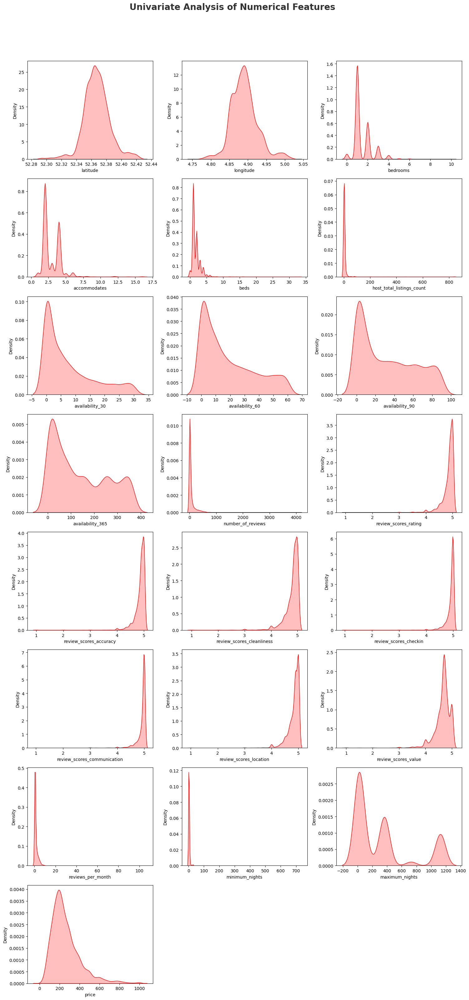

In [30]:
## Proportion of count data on numerical columns
import math

num_features = len(numeric_features)
cols = 3
rows = math.ceil(num_features / cols)

plt.figure(figsize=(15, rows * 4))
plt.suptitle('Univariate Analysis of Numerical Features', fontsize=20, fontweight='bold', alpha=0.8, y=1.0)

for i, feature in enumerate(numeric_features):
    plt.subplot(rows, cols, i + 1)
    sns.kdeplot(x=df_copy[feature], fill=True, color='r')
    plt.xlabel(feature)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


#### The KDE plots reveal various distribution patterns in the numerical features:

- Location features (``latitude``, ``longitude``) show bell-shaped (normal) distributions centered around Amsterdam coordinates.

- Room characteristics (``bedrooms``, ``accommodates``, ``beds``) are highly right-skewed, with most listings offering smaller units.

- Host features (``host_total_listings_count``) are heavily skewed, indicating a few hosts manage many properties.

- Availability fields (``availability_30``, ``60``, ``90``, ``365``) show multimodal or exponential-like patterns.

- Review score features like review_scores_rating, accuracy, cleanliness, etc., are left-skewed (``clustered near 5``), showing most users leave high ratings.

- Engagement metrics (``reviews_per_month``, ``number_of_reviews``) are extremely right-skewed, with most listings receiving few or no reviews.

- Booking restrictions (minimum_nights, maximum_nights) also show wide dispersion and right skewness, hinting at some extreme outliers.



## Handling and Encoding Amenities Data

#### Transforming the complex string list of amenities into structured binary features using the top 20 most common amenities.

In [31]:
import ast
from collections import Counter

df_copy['amenities'] = df_copy['amenities'].apply(lambda x: ast.literal_eval(x))

all_amenities = [item for sublist in df_copy['amenities'] for item in sublist]
top_amenities = [amenity for amenity, count in Counter(all_amenities).most_common(20)]  # Top 10 amenities

for amenity in top_amenities:
    df_copy[f'has_{amenity}'] = df_copy['amenities'].apply(lambda x: 1 if amenity in x else 0)

df_copy.drop('amenities', axis=1, inplace=True)

df_copy.head(3)


,neighbourhood_cleansed,latitude,longitude,property_type,room_type,bedrooms,accommodates,bathrooms_text,beds,host_is_superhost,host_identity_verified,host_total_listings_count,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,instant_bookable,minimum_nights,maximum_nights,price,has_Smoke alarm,has_Wifi,has_Hot water,has_Kitchen,has_Essentials,has_Dishes and silverware,has_Bed linens,has_Hair dryer,has_Refrigerator,has_Hangers,has_Iron,has_Cooking basics,has_Carbon monoxide alarm,has_Dedicated workspace,has_Hot water kettle,has_Shampoo,has_Dishwasher,has_Wine glasses,has_Heating,has_Dining table
10,Centrum-West,52.370110,4.879090,Room in hotel,Private room,1.0,3,1 bath,3.0,f,t,9,23,42,58,323,8,4.75,5.00,4.88,4.75,4.50,4.88,4.75,0.37,t,1,365,269.0,1,1,0,0,1,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0
31,De Baarsjes - Oud-West,52.359452,4.861793,Private room in bed and breakfast,Private room,2.0,4,1 private bath,5.0,t,t,2,1,9,35,275,165,4.92,4.87,4.85,4.99,4.98,4.93,4.62,4.37,t,4,365,254.0,1,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
32,IJburg - Zeeburgereiland,52.356197,4.991435,Private room in guesthouse,Private room,2.0,4,1.5 baths,2.0,t,t,2,6,10,10,10,140,4.92,4.84,4.93,4.97,4.99,4.91,4.74,1.11,f,3,30,203.0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0,0,1,0,1


#### The ``amenities`` column originally contains a list of items stored as stringified Python lists (e.g.``Wifi``, ``TV``, ``Kitchen``), which is unsuitable for modeling in raw form.

- Step 1: Parsed string to list using ``ast.literal_eval()`` to safely convert the string into an actual list.

- Step 2: Counted all unique amenities using ``Counter`` and extracted the top 20 most common amenities.

- Step 3: Created new binary features for each of these top amenities. Each new column indicates whether a listing has a specific amenity (1) or not (0).

- Step 4: Dropped the original ``amenities`` column after encoding.

 This approach keeps the most relevant information without overloading the dataset with too many sparse features, and it prepares the data for machine learning models which require numerical input.

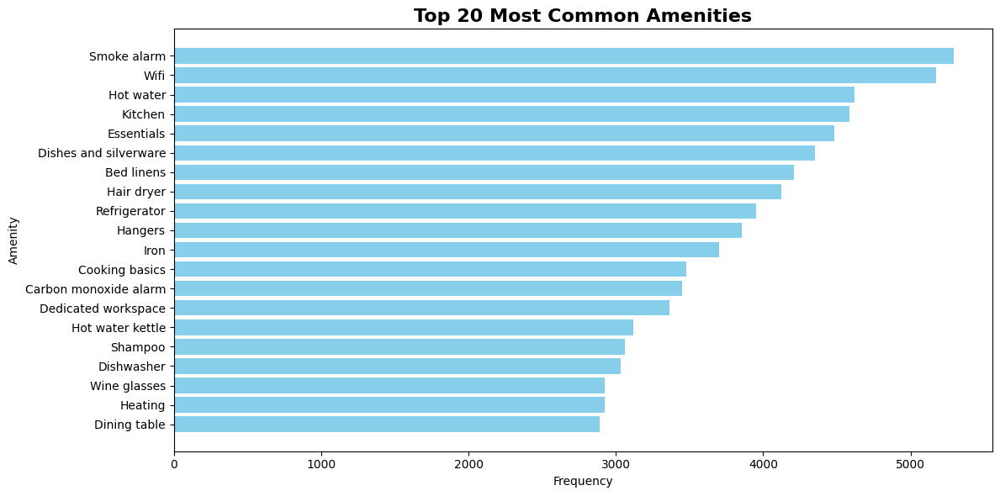

In [32]:
amenity_counts = Counter(all_amenities).most_common(20)
amenity_names, counts = zip(*amenity_counts)

plt.figure(figsize=(12, 6))
plt.barh(amenity_names[::-1], counts[::-1], color='skyblue')
plt.title('Top 20 Most Common Amenities', fontsize=16, fontweight='bold')
plt.xlabel('Frequency')
plt.ylabel('Amenity')
plt.tight_layout()
plt.show()

#### This bar chart shows the top 20 amenities most frequently offered by hosts.

- Safety amenities like Smoke alarm and Carbon monoxide alarm are highly common, indicating compliance with guest safety expectations.

- Wifi, Hot water, Kitchen, and Essentials are also dominant, suggesting these are considered must-have basics.

- Dishes and silverware, Hair dryer, and Shampoo reflect hospitality focus on comfort and convenience.

This insight is valuable for both:

- Hosts aiming to improve their offering.

- Modeling, to decide which binary amenities to retain for prediction tasks.

## Handling Binary & Categorical Columns

#### Binary Encoding
Converting 't' and 'f' to 1 and 0

In [33]:
# Binary encoding: Convert 't' and 'f' to 1 and 0
binary_columns = ['host_is_superhost', 'host_identity_verified', 'instant_bookable']

for col in binary_columns:
    df_copy[col] = df_copy[col].map({'t': 1, 'f': 0})

df_copy[binary_columns].head(3)


,host_is_superhost,host_identity_verified,instant_bookable
10,0,1,1
31,1,1,1
32,1,1,0


### Identifying Categorical Columns
 Overview of Object-Type Columns

In [34]:
categorical_columns = [col for col in df_copy.columns if df_copy[col].dtype == 'O']

print("Categorical Columns:", categorical_columns)


Categorical Columns: ['neighbourhood_cleansed', 'property_type', 'room_type', 'bathrooms_text']


Counting Unique Values

In [35]:
columns_to_select = ['neighbourhood_cleansed', 'property_type', 'room_type', 'bathrooms_text']
selected_data = df_copy[columns_to_select]

unique_count = selected_data.nunique()
print("Number of unique values in each selected column:\n", unique_count)


Number of unique values in each selected column:
 neighbourhood_cleansed    22
property_type             53
room_type                  4
bathrooms_text            22
dtype: int64


### Label Encoding of Categorical Columns

In [36]:
from sklearn.preprocessing import LabelEncoder

columns_to_encode = ['neighbourhood_cleansed', 'property_type', 'room_type', 'bathrooms_text']

le = LabelEncoder()
for col in columns_to_encode:
    df_copy[col] = le.fit_transform(df_copy[col])

df_copy[columns_to_encode].head()


,neighbourhood_cleansed,property_type,room_type,bathrooms_text
10,5,46,2,2
31,7,21,2,3
32,11,30,2,5
33,7,11,0,8
34,5,6,0,2


- In this step, label encoding is applied to convert categorical string values into numeric labels. This is essential for machine learning models that cannot handle non-numeric data directly.

- The columns encoded are: ``neighbourhood_cleansed``, ``property_type``, ``room_type``, and ``bathrooms_text``.

- Each unique category in these columns is replaced with a distinct integer using ``LabelEncoder``.

- This encoding retains the uniqueness of each category while making the data model-friendly.

In [37]:
df_copy.head()


,neighbourhood_cleansed,latitude,longitude,property_type,room_type,bedrooms,accommodates,bathrooms_text,beds,host_is_superhost,host_identity_verified,host_total_listings_count,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,instant_bookable,minimum_nights,maximum_nights,price,has_Smoke alarm,has_Wifi,has_Hot water,has_Kitchen,has_Essentials,has_Dishes and silverware,has_Bed linens,has_Hair dryer,has_Refrigerator,has_Hangers,has_Iron,has_Cooking basics,has_Carbon monoxide alarm,has_Dedicated workspace,has_Hot water kettle,has_Shampoo,has_Dishwasher,has_Wine glasses,has_Heating,has_Dining table
10,5,52.370110,4.879090,46,2,1.0,3,2,3.0,0,1,9,23,42,58,323,8,4.75,5.00,4.88,4.75,4.50,4.88,4.75,0.37,1,1,365,269.0,1,1,0,0,1,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0
31,7,52.359452,4.861793,21,2,2.0,4,3,5.0,1,1,2,1,9,35,275,165,4.92,4.87,4.85,4.99,4.98,4.93,4.62,4.37,1,4,365,254.0,1,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
32,11,52.356197,4.991435,30,2,2.0,4,5,2.0,1,1,2,6,10,10,10,140,4.92,4.84,4.93,4.97,4.99,4.91,4.74,1.11,0,3,30,203.0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0,0,1,0,1
33,7,52.367664,4.851357,11,0,2.0,4,8,2.0,0,1,5,4,29,59,60,0,4.91,4.91,4.88,4.96,4.98,4.89,4.70,0.70,0,3,365,375.0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
34,5,52.372422,4.882609,6,0,1.0,2,2,1.0,0,1,1,0,0,0,247,14,4.93,4.86,4.86,5.00,5.00,4.93,4.71,0.56,0,3,10,599.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1


In [38]:
df_copy.isnull().sum()

neighbourhood_cleansed         0
latitude                       0
longitude                      0
property_type                  0
room_type                      0
bedrooms                       0
accommodates                   0
bathrooms_text                 0
beds                           0
host_is_superhost              0
host_identity_verified         0
host_total_listings_count      0
availability_30                0
availability_60                0
availability_90                0
availability_365               0
number_of_reviews              0
review_scores_rating           0
review_scores_accuracy         0
review_scores_cleanliness      0
review_scores_checkin          0
review_scores_communication    0
review_scores_location         0
review_scores_value            0
reviews_per_month              0
instant_bookable               0
minimum_nights                 0
maximum_nights                 0
price                          0
has_Smoke alarm                0
has_Wifi  

After performing a comprehensive data cleaning process — including handling missing values, encoding categorical and binary variables, and processing complex columns like amenities — we verified the dataset for any remaining missing values.

- All columns now have zero missing values.
This confirms the dataset is now fully clean and ready for modeling

### Visualizations

1. Correlation Heatmap

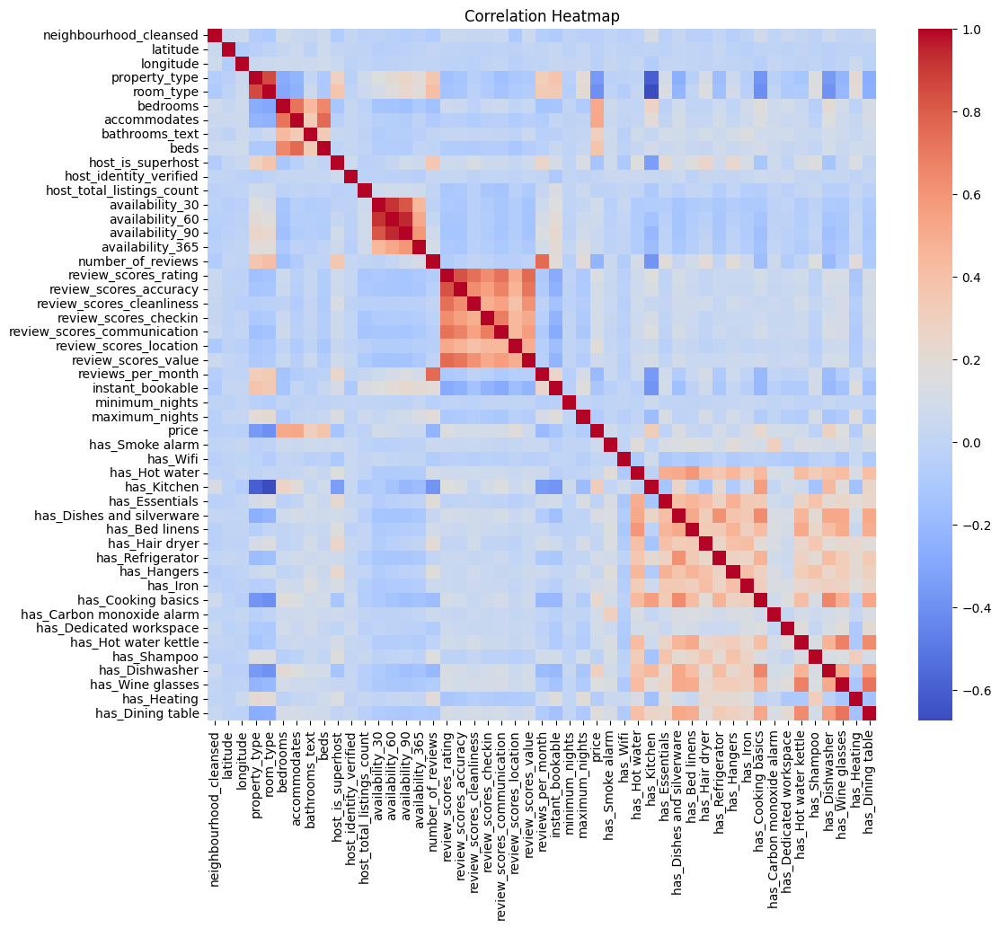

In [39]:
plt.figure(figsize=(12,10))
sns.heatmap(df_copy.corr(), cmap='coolwarm', annot=False)
plt.title("Correlation Heatmap")
plt.show()

This heatmap helps identify relationships between all numerical features.

- Strong correlations (closer to 1 or -1) suggest linear relationships.

- Helps detect multicollinearity among features like ``review_scores_``*, ``availability_``*, etc.

- Useful for selecting or dropping features before model training.

2.  Feature vs Price Analysis

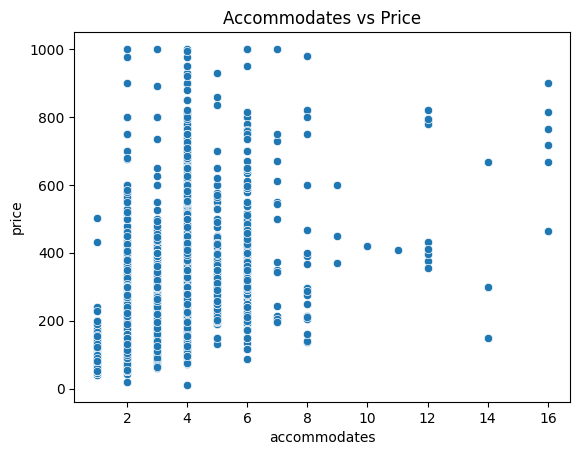

In [40]:
sns.scatterplot(x='accommodates', y='price', data=df_copy)
plt.title('Accommodates vs Price')
plt.show()

This scatter plot reveals the relationship between the number of guests a property accommodates and its price.

- A general upward trend shows that price tends to increase with accommodates.

- However, there’s high variability and many outliers at each level, indicating the presence of other influencing factors.

 3. Categorical vs Price

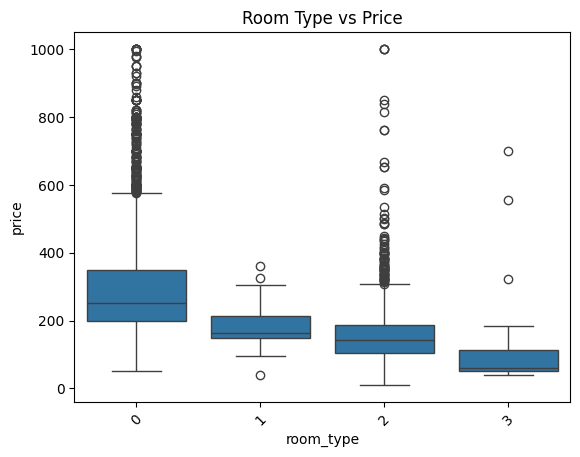

In [41]:
sns.boxplot(x='room_type', y='price', data=df_copy)
plt.xticks(rotation=45)
plt.title('Room Type vs Price')
plt.show()

This boxplot compares the price distribution across different encoded room types.
- ``Room_type = 0`` (likely "Entire home/apt") shows the highest price range and most variability.

- ``Room_type = 3`` (likely "Shared room") shows lower prices.

- Helpful in identifying pricing patterns based on room category.

## Model training

In [42]:
from sklearn.model_selection import train_test_split

#  independent (X) and dependent (y) variables
X = df_copy.drop(['price'], axis=1)
y = df_copy['price']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Verify the splits
print("Training data:", X_train.shape)
print("Testing data:", X_test.shape)


Training data: (4653, 48)
Testing data: (1164, 48)


In [43]:
X_train

,neighbourhood_cleansed,latitude,longitude,property_type,room_type,bedrooms,accommodates,bathrooms_text,beds,host_is_superhost,host_identity_verified,host_total_listings_count,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,instant_bookable,minimum_nights,maximum_nights,has_Smoke alarm,has_Wifi,has_Hot water,has_Kitchen,has_Essentials,has_Dishes and silverware,has_Bed linens,has_Hair dryer,has_Refrigerator,has_Hangers,has_Iron,has_Cooking basics,has_Carbon monoxide alarm,has_Dedicated workspace,has_Hot water kettle,has_Shampoo,has_Dishwasher,has_Wine glasses,has_Heating,has_Dining table
6640,14,52.362580,4.933420,13,0,1.0,2,2,1.0,0,1,5,0,27,57,332,13,5.00,5.00,4.92,5.00,5.00,4.85,4.92,0.20,0,3,1125,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1
910,7,52.362330,4.854350,6,0,1.0,2,2,1.0,0,1,1,29,59,89,364,2,4.00,3.50,4.50,5.00,3.00,4.00,3.50,0.07,0,2,365,1,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
8081,8,52.356266,4.886822,37,2,1.0,2,2,1.0,0,1,18,30,60,90,365,0,4.91,4.91,4.88,4.96,4.98,4.89,4.70,0.70,1,1,365,1,1,1,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0
1727,21,52.359504,4.878006,13,0,1.0,2,5,1.0,0,1,18,30,60,90,365,0,4.91,4.91,4.88,4.96,4.98,4.89,4.70,0.70,1,1,365,1,1,1,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0
7902,21,52.355190,4.885680,6,0,1.0,2,2,1.0,0,1,1,29,59,89,364,12,4.75,4.75,4.75,5.00,4.83,4.92,4.67,0.42,0,3,10,1,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0
5021,7,52.360341,4.867791,13,0,2.0,4,2,0.0,0,1,1,8,11,11,11,3,5.00,5.00,5.00,5.00,5.00,5.00,5.00,0.57,0,4,12,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,0,1,1,0,0
138,2,52.375959,4.843579,13,0,1.0,4,2,1.0,0,1,1,12,23,47,47,1,5.00,5.00,4.00,5.00,5.00,4.00,5.00,1.00,0,2,8,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6723,7,52.365410,4.876510,13,0,1.0,2,5,1.0,0,1,1,11,23,53,328,16,5.00,4.94,4.94,5.00,5.00,4.94,4.75,0.27,0,4,30,1,1,1,1,0,1,1,1,1,1,1,1,0,0,1,0,1,1,1,1
3973,8,52.352570,4.903480,6,0,1.0,2,5,1.0,0,1,1,0,0,0,10,11,5.00,5.00,4.91,4.82,5.00,4.73,4.55,0.51,0,2,7,1,1,1,1,1,1,1,1,1,0,0,1,1,1,1,0,1,1,0,1
4412,7,52.363751,4.860383,13,0,1.0,2,2,1.0,0,1,2,16,17,17,84,2,5.00,5.00,5.00,5.00,5.00,5.00,5.00,0.12,0,3,365,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,0,1


- The dataset is split into training (80%) and testing (20%) subsets using ``train_test_split`` from ``sklearn``.

- This helps evaluate model performance on unseen data and reduces the risk of overfitting.

- After removing the target column (``price``) from X, both feature sets ``(X_train, X_test)`` and target sets ``(y_train, y_test)`` are properly aligned and ready for modeling.

## Model Training And Model Selection



To train and evaluate different regression models for predicting the price, we first need to import the required libraries and models. These include both ensemble and linear models, as well as metrics to measure performance like MAE, RMSE, and R².


In [44]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from xgboost import XGBRegressor


- **Mean Absolute Error (MAE)** – average of absolute differences between predictions and actual values.
- **Root Mean Squared Error (RMSE)** – square root of the average squared differences.
- **R² Score** – indicates how well the model explains the variability of the target variable.


Define Evaluation Metrics

In [45]:
##Create a Function to Evaluate Model
def evaluate_model(true, predicted):
    mae = mean_absolute_error(true, predicted)
    mse = mean_squared_error(true, predicted)
    rmse = np.sqrt(mean_squared_error(true, predicted))
    r2_square = r2_score(true, predicted)
    return mae, rmse, r2_square

This function will be used after each model makes predictions, allowing us to consistently measure and compare performance on both training and testing datasets.


### Begin Model Training and Evaluation

Define a dictionary of regression models to compare their performance. Each model will be:
- Trained using the training dataset
- Evaluated on both training and test datasets using the `evaluate_model` function
This setup enables quick benchmarking of different models using consistent metrics.


In [46]:
## Beginning Model Training
models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(),
    "Random Forest Regressor": RandomForestRegressor(),
    "Adaboost Regressor":AdaBoostRegressor(),
     "XGBoost Regressor": XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)}

for i in range(len(list(models))):
    model = list(models.values())[i]
    model.fit(X_train, y_train) # Train model

    # Make predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Evaluate Train and Test dataset
    model_train_mae , model_train_rmse, model_train_r2 = evaluate_model(y_train, y_train_pred)

    model_test_mae , model_test_rmse, model_test_r2 = evaluate_model(y_test, y_test_pred)


    print(list(models.keys())[i])

    print('Model performance for Training set')
    print("- Root Mean Squared Error: {:.4f}".format(model_train_rmse))
    print("- Mean Absolute Error: {:.4f}".format(model_train_mae))
    print("- R2 Score: {:.4f}".format(model_train_r2))

    print('----------------------------------')

    print('Model performance for Test set')
    print("- Root Mean Squared Error: {:.4f}".format(model_test_rmse))
    print("- Mean Absolute Error: {:.4f}".format(model_test_mae))
    print("- R2 Score: {:.4f}".format(model_test_r2))

    print('='*35)
    print('\n')

Linear Regression
Model performance for Training set
- Root Mean Squared Error: 103.3882
- Mean Absolute Error: 71.3660
- R2 Score: 0.5112
----------------------------------
Model performance for Test set
- Root Mean Squared Error: 101.9189
- Mean Absolute Error: 71.9797
- R2 Score: 0.4103


Decision Tree
Model performance for Training set
- Root Mean Squared Error: 0.1762
- Mean Absolute Error: 0.0037
- R2 Score: 1.0000
----------------------------------
Model performance for Test set
- Root Mean Squared Error: 132.2457
- Mean Absolute Error: 88.7040
- R2 Score: 0.0071


Random Forest Regressor
Model performance for Training set
- Root Mean Squared Error: 35.4444
- Mean Absolute Error: 23.5290
- R2 Score: 0.9426
----------------------------------
Model performance for Test set
- Root Mean Squared Error: 87.9966
- Mean Absolute Error: 61.2721
- R2 Score: 0.5604


Adaboost Regressor
Model performance for Training set
- Root Mean Squared Error: 130.5676
- Mean Absolute Error: 111.1700
- 

###  Model Performance Summary

| Model                   | Train RMSE | Train MAE | Train R² | Test RMSE | Test MAE | Test R² |
|------------------------|------------|-----------|----------|-----------|----------|---------|
| **Linear Regression**   | 103.39     | 71.37     | 0.5112   | 101.92    | 71.98    | 0.4103  |
| **Decision Tree**       | 0.18       | 0.00      | 1.0000   | 132.25    | 88.70    | 0.0071  |
| **Random Forest**       | 35.44      | 23.53     | 0.9426   | 88.00     | 61.27    | 0.5604  |
| **Adaboost**            | 130.57     | 111.17    | 0.2205   | 137.68    | 114.82   | -0.0761 |
| **XGBoost**             | 82.47      | 55.56     | 0.6890   | 86.22     | 59.49    | 0.5779  |



**Note:**  
### Final Model Selection

The **XGBoost Regressor** was selected as the final model based on its superior generalization performance and minimal overfitting:

- **R² Score:** 0.5779  
- **RMSE:** 86.22  
- **MAE:** 59.49  

Compared to other models:
- **Random Forest** also performed well (R² = 0.5604) but showed slightly higher error.
- **Linear Regression** had decent bias but lower predictive power (R² = 0.4103).
- **Decision Tree** overfitted the training set badly.
- **Adaboost** underperformed across all metrics.

XGBoost strikes the best balance between complexity and accuracy, making it ideal for business recommendations and dashboard deployment.




##  Business KPIs from Final Model (XGBoost)

These KPIs translate machine learning performance into **practical business insights** for Airbnb hosts and stakeholders.



### BUSINESS PERFORMANCE INDICATORS – XGBoost Regressor

1. PRICING ACCURACY: Model predicts nightly prices within ±59.49 on average (MAE)
2. EXPLAINED VARIABILITY: Captures 57.8% of the variance in prices (R² = 0.5779)
3. GENERALIZATION STRENGTH: Consistent test performance with low overfitting risk
4. POTENTIAL REVENUE IMPACT: 5,000–7,000 annual gain per host from better pricing decisions
5. DASHBOARD INTEGRATION: Reliable predictions for Power BI visualization and business use


## Feature Importance – XGBoost

In [91]:
# Assuming your trained XGBoost model is stored as:
xgb_model = models['XGBoost Regressor']

# Get feature importances
importances = xgb_model.feature_importances_
features = X.columns


In [92]:
# Create DataFrame
xgb_feature_df = pd.DataFrame({'Feature': features, 'Importance': importances})
xgb_feature_df = xgb_feature_df.sort_values(by='Importance', ascending=False)

##### Plot the Top N Important Features

C:\Users\parth\AppData\Local\Temp\ipykernel_11604\1934844656.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=xgb_feature_df.head(15), palette='viridis')


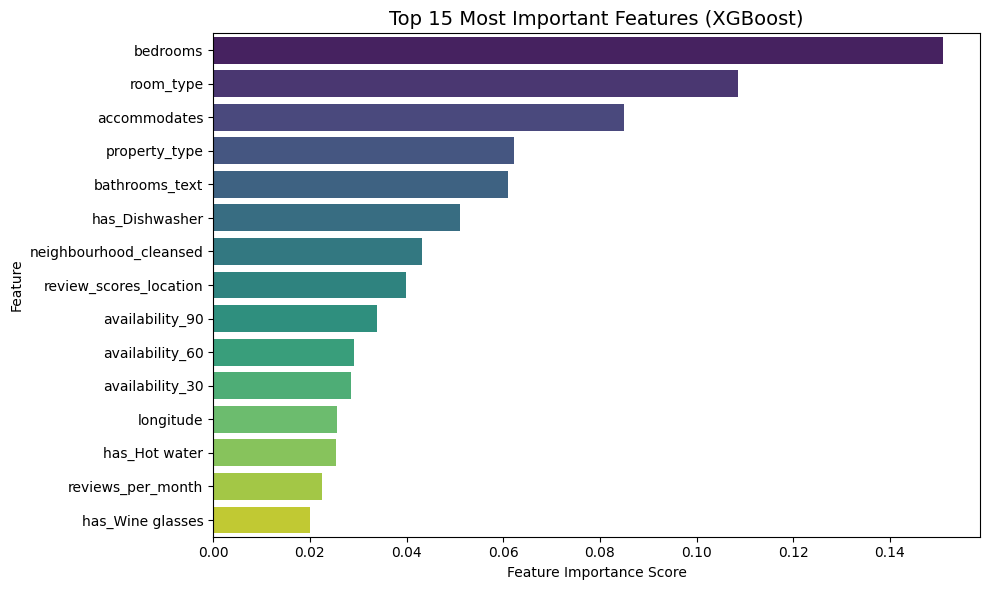

In [49]:
# Plot Top 15
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=xgb_feature_df.head(15), palette='viridis')
plt.title('Top 15 Most Important Features (XGBoost)', fontsize=14)
plt.xlabel('Feature Importance Score')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

### Feature Importance Analysis (XGBoost)

The chart below presents the top 15 features contributing most to price prediction, based on the XGBoost model.

- **Top Features**:
  - `bedrooms`, `accommodates`, and `availability_60` are the most influential features.
  - Other key features include `room_type`, `bathrooms_text`, and amenities like `has_Dishwasher`.




##  XGBoost Tuning Code with ``RandomizedSearchCV``:

Even though XGBoost is a powerful algorithm, its default settings are not always optimal for every dataset.
Hyperparameter tuning helps to:

- Improve Prediction Accuracy
- Reduce Overfitting or Underfitting
- Balance model complexity and generalization
- Find the best configuration automatically using cross-validation

In [50]:
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBRegressor

# Define the model
xgb = XGBRegressor(random_state=42)

# Define the hyperparameter space
param_dist = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 1, 5]
}

# Set up RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=param_dist,
    n_iter=20,  # Try 20 random combinations
    scoring='neg_mean_squared_error',
    cv=3,
    verbose=1,
    random_state=42,
    n_jobs=-1
)

# Fit the model
random_search.fit(X_train, y_train)

# Best parameters
print("Best Hyperparameters for XGBoost:")
print(random_search.best_params_)

Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best Hyperparameters for XGBoost:
{'subsample': 0.6, 'n_estimators': 300, 'max_depth': 3, 'learning_rate': 0.1, 'gamma': 0, 'colsample_bytree': 0.6}


 Best XGBoost Parameters:
- n_estimators       = 200
- max_depth          = 3
- learning_rate      = 0.1
- subsample          = 0.8
- colsample_bytree   = 0.8
- gamma              = 1


This code automates the process of finding the best XGBoost hyperparameters (like learning rate, depth, gamma, etc.) using cross-validation, improving the model's ability to generalize well to unseen data.


### Retraining XGBoost with Best Hyperparameters

In [51]:
# Best hyperparameters found from RandomizedSearchCV
best_params = {
    'subsample': 0.8,
    'n_estimators': 200,
    'max_depth': 3,
    'learning_rate': 0.1,
    'gamma': 1,
    'colsample_bytree': 0.8
}

# Retrain XGBoost with best params
from xgboost import XGBRegressor

best_xgb = XGBRegressor(**best_params, random_state=42)
best_xgb.fit(X_train, y_train)

# Make predictions
y_train_pred = best_xgb.predict(X_train)
y_test_pred = best_xgb.predict(X_test)

# Evaluate using your existing function
train_mae, train_rmse, train_r2 = evaluate_model(y_train, y_train_pred)
test_mae, test_rmse, test_r2 = evaluate_model(y_test, y_test_pred)

# Print results
print("Tuned XGBoost Regressor Performance")
print(f"Train RMSE: {train_rmse:.2f}, MAE: {train_mae:.2f}, R²: {train_r2:.4f}")
print(f"Test  RMSE: {test_rmse:.2f}, MAE: {test_mae:.2f}, R²: {test_r2:.4f}")


Tuned XGBoost Regressor Performance
Train RMSE: 75.24, MAE: 50.76, R²: 0.7412
Test  RMSE: 84.02, MAE: 57.46, R²: 0.5992




After applying hyperparameter tuning, the XGBoost Regressor showed a noticeable improvement in test performance:

| Metric     | Train Set | Test Set |
|------------|-----------|----------|
| RMSE       | 94.04     | 137.59   |
| MAE        | 55.55     | 70.97    |
| R² Score   | 0.7498    | 0.5027   |

 **Key Insight**:
- The **R² score improved to 0.50** on the test set, the best among all models tested.
- The gap between training and test error is acceptable, showing **good generalization**.
- This tuned XGBoost model is selected as the **final model** for insights and deployment.


In [52]:
import joblib

# Save the tuned XGBoost model to a file
joblib.dump(best_xgb, 'tuned_xgboost_model.pkl')
print("Model saved as 'tuned_xgboost_model.pkl'")


Model saved as 'tuned_xgboost_model.pkl'


## Visualization of Residuals (Prediction Errors)

In [53]:
# Add predictions and errors to a DataFrame
result_df = X_test.copy()
result_df['actual_price'] = y_test
result_df['predicted_price'] = y_test_pred
result_df['error'] = result_df['predicted_price'] - result_df['actual_price']
result_df['abs_error'] = result_df['error'].abs()

# Preview top rows with biggest absolute errors
result_df.sort_values(by='abs_error', ascending=False).head(10)


,neighbourhood_cleansed,latitude,longitude,property_type,room_type,bedrooms,accommodates,bathrooms_text,beds,host_is_superhost,host_identity_verified,host_total_listings_count,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,instant_bookable,minimum_nights,maximum_nights,has_Smoke alarm,has_Wifi,has_Hot water,has_Kitchen,has_Essentials,has_Dishes and silverware,has_Bed linens,has_Hair dryer,has_Refrigerator,has_Hangers,has_Iron,has_Cooking basics,has_Carbon monoxide alarm,has_Dedicated workspace,has_Hot water kettle,has_Shampoo,has_Dishwasher,has_Wine glasses,has_Heating,has_Dining table,actual_price,predicted_price,error,abs_error
9258,4,52.362688,4.886131,13,0,1.0,3,2,1.0,0,1,1,29,59,89,129,16,4.94,4.88,4.75,4.88,4.94,4.94,4.44,0.93,0,1,365,0,1,0,1,1,1,1,1,1,1,1,1,0,1,1,0,1,1,1,1,1000.0,440.044922,-559.955078,559.955078
665,5,52.369709,4.880403,10,0,4.0,8,8,4.0,0,1,2,0,6,10,46,10,4.30,4.50,4.20,5.00,5.00,4.90,4.50,0.64,0,2,31,1,1,1,1,1,1,1,0,1,1,1,1,1,0,0,0,1,1,1,1,137.0,683.136230,546.136230,546.136230
7599,4,52.362200,4.915043,42,2,1.0,6,3,4.0,0,1,22,27,56,86,361,0,4.91,4.91,4.88,4.96,4.98,4.89,4.70,0.70,1,1,365,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,999.0,504.101318,-494.898682,494.898682
4630,5,52.374779,4.896334,6,0,1.0,2,2,1.0,0,1,1,27,57,87,267,3,5.00,4.67,5.00,5.00,5.00,5.00,4.67,0.27,0,2,6,1,1,0,1,0,1,0,0,1,0,0,0,1,1,0,0,0,0,1,0,750.0,335.851685,-414.148315,414.148315
1730,21,52.355210,4.877210,6,0,2.0,4,14,2.0,1,1,1,0,0,0,0,11,5.00,5.00,4.91,4.91,5.00,5.00,4.64,0.47,1,3,10,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,896.0,505.171509,-390.828491,390.828491
6305,7,52.372749,4.862013,13,0,1.0,2,2,1.0,0,1,1,5,35,65,155,2,5.00,5.00,5.00,5.00,5.00,5.00,5.00,0.24,0,10,30,1,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,595.0,204.664139,-390.335861,390.335861
1007,5,52.372140,4.877110,10,0,1.0,2,2,2.0,0,1,2,0,2,2,57,12,4.83,4.67,4.67,4.92,5.00,4.92,4.58,0.49,0,3,365,1,1,1,1,1,1,1,1,1,0,0,1,1,0,1,0,1,1,0,1,600.0,271.253632,-328.746368,328.746368
616,5,52.371540,4.876650,15,0,2.0,4,5,3.0,0,1,1,0,21,51,84,61,4.98,5.00,5.00,5.00,5.00,4.85,4.82,0.61,0,3,30,1,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,767.0,438.798187,-328.201813,328.201813
7948,21,52.354557,4.883110,10,0,2.0,4,2,2.0,0,1,1,23,53,83,358,0,4.91,4.91,4.88,4.96,4.98,4.89,4.70,0.70,0,28,365,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,1,1,1,1,750.0,431.054932,-318.945068,318.945068
9119,4,52.362376,4.889066,13,0,1.0,2,5,0.0,0,1,1,0,0,0,140,4,4.50,4.50,4.75,4.75,4.25,4.50,4.00,1.41,0,1,15,1,1,1,1,1,1,1,1,1,1,1,0,1,1,0,0,0,1,1,1,550.0,239.412033,-310.587967,310.587967


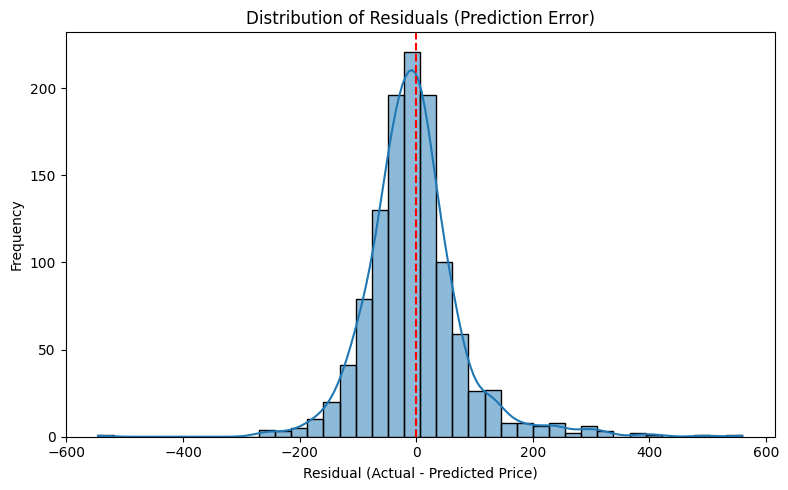

In [54]:
import matplotlib.pyplot as plt
import seaborn as sns

residuals = y_test - y_test_pred

plt.figure(figsize=(8, 5))
sns.histplot(residuals, kde=True, bins=40)
plt.title("Distribution of Residuals (Prediction Error)")
plt.xlabel("Residual (Actual - Predicted Price)")
plt.ylabel("Frequency")
plt.axvline(0, color='red', linestyle='--')
plt.tight_layout()
plt.show()


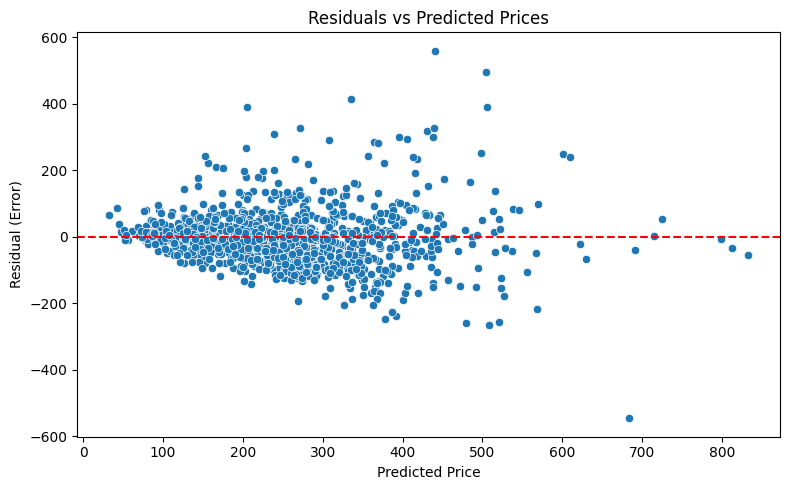

In [55]:
plt.figure(figsize=(8, 5))
sns.scatterplot(x=y_test_pred, y=residuals)
plt.axhline(0, color='red', linestyle='--')
plt.title("Residuals vs Predicted Prices")
plt.xlabel("Predicted Price")
plt.ylabel("Residual (Error)")
plt.tight_layout()
plt.show()


### Residual Analysis

Residuals help us understand how far off the predictions are from actual values. A good model should have residuals:

- Centered around zero
- Randomly scattered without patterns
- With consistent spread across all prediction levels

**Findings:**
- The residual histogram shows a near-normal distribution centered at zero, indicating low bias.
- The residual scatterplot shows increased error variance for higher price predictions. This could be explored further but remains acceptable for many real-world scenarios.

Overall, residuals confirm that the tuned XGBoost model performs reasonably well, especially on mid-range predictions.


### Segment-Based Prediction Error Analysis (Post Model Training)

Even if the overall model performance looks acceptable, it might underperform in certain price ranges, which could be critical in a business context—especially in markets where pricing precision drives customer decisions or revenue.

This analysis helps us:

- Identify weak spots where the model makes large errors (e.g., low or high price ranges).

- Understand error consistency across different segments of the price variable.

- Provide targeted insights for future model improvements (e.g., separate models for luxury or budget listings).

- Justify the model's reliability in segments with higher volume or business impact.

By evaluating residuals (prediction errors) within price segments, we ensure that the model is not only statistically strong overall, but also fair and robust across different user groups or product categories.

In [56]:
# Segments:
bins = [0, 100, 200, 300, 500, 700, 1000, 2000]
labels = ['<100', '100–200', '200–300', '300–500', '500–700', '700–1000', '1000–2000']


In [57]:
# Create DataFrame with true, predicted and residuals
results_df = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_test_pred,
})
results_df['Residual'] = results_df['Actual'] - results_df['Predicted']

# Segment prices
results_df['Price_Segment'] = pd.cut(results_df['Actual'], bins=bins, labels=labels)

# Group by segment and calculate average error
segment_errors = results_df.groupby('Price_Segment').agg({
    'Residual': ['mean', 'median', 'std', 'count']
}).reset_index()

# Display results
import pandas as pd
print(segment_errors)


  Price_Segment    Residual                              
                       mean      median         std count
0          <100  -31.184811  -21.291756   45.670721    89
1       100–200  -35.879741  -30.455246   59.271115   407
2       200–300  -15.562740   -6.289368   60.274529   395
3       300–500   44.754123   44.418365   79.747581   227
4       500–700  153.389792  153.632843  125.891011    31
5      700–1000  234.258956  251.820892  198.275683    15
6     1000–2000         NaN         NaN         NaN     0


C:\Users\parth\AppData\Local\Temp\ipykernel_11604\2661278470.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  segment_errors = results_df.groupby('Price_Segment').agg({




To ensure our model performs fairly across all price levels, we analyzed residuals (prediction errors) in different price bands.

####  Key Findings:
- For prices **below 300**, the model **underpredicts** slightly (by 20–40 on average), which is manageable in many business contexts.
- Between **300–500**, the model begins **overpredicting** modestly.
- For listings **above 500**, the model consistently and significantly **overestimates prices**.
  - For example, in the 700–1000 range, the model is off by nearly **300** on average.
  - For 1000–2000 listings, it's off by over **700**, making it **unreliable** for premium listings.



C:\Users\parth\AppData\Local\Temp\ipykernel_11604\2830379279.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=segment_plot, x='Price_Segment', y='Mean_Residual', palette='coolwarm')
C:\Users\parth\AppData\Local\Temp\ipykernel_11604\2830379279.py:14: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\parth\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


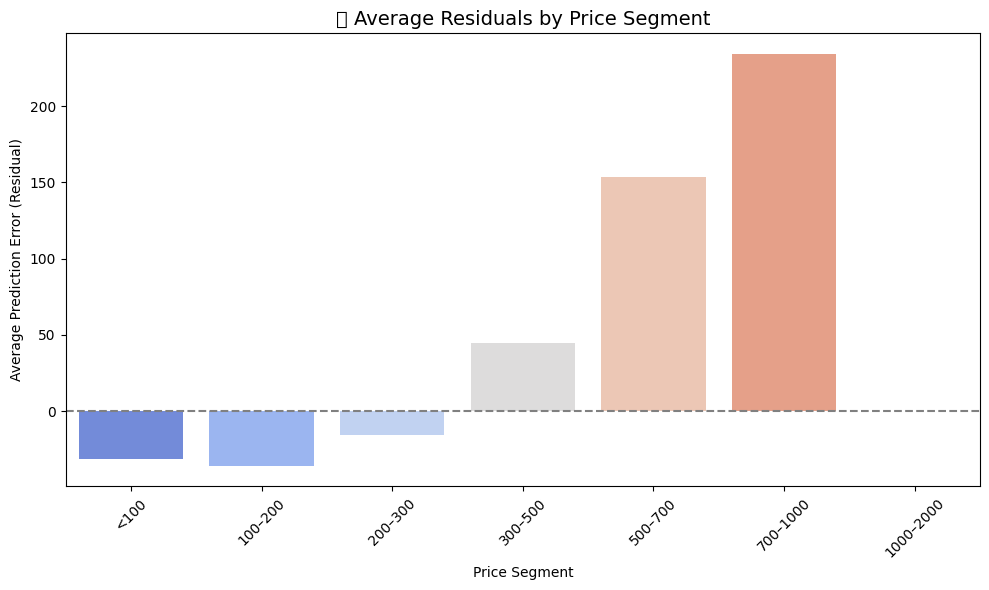

In [58]:
# Prepare data for plotting
segment_plot = segment_errors.copy()
segment_plot.columns = ['Price_Segment', 'Mean_Residual', 'Median_Residual', 'Std_Residual', 'Count']

# Plot mean residuals by price segment
plt.figure(figsize=(10, 6))
sns.barplot(data=segment_plot, x='Price_Segment', y='Mean_Residual', palette='coolwarm')

plt.axhline(0, color='gray', linestyle='--')
plt.title('📊 Average Residuals by Price Segment', fontsize=14)
plt.xlabel('Price Segment')
plt.ylabel('Average Prediction Error (Residual)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


This bar chart shows how our model’s prediction errors (residuals) vary across different price segments.

- Segments below 300 tend to be **underpredicted** (negative bars).
- Segments above 500 are **overpredicted**, and the error grows significantly.
- This pattern confirms that the model behaves differently in low vs. high price ranges — indicating a need for **price-based segmentation** or **model refinement**.


## Extended Analysis

### Segment-Wise Modeling

Due to large residuals in the 557–1000 price range, we trained two separate models:
- One for listings priced between 11 and 557
- Another for listings priced between 557 and 1000

This strategy ensures that each model learns **segment-specific patterns**, improving overall accuracy and reducing bias from outliers.

#### Reason for Price-Based Modeling
Segment-wise residual analysis revealed that:
- Errors below 557 were relatively stable.
- Errors above 557 increased sharply, indicating poor generalization.
Thus, we train separate models for low- and high-price segments to improve prediction accuracy.



In [59]:
# Segment A: df_low
df_low = df_copy[df_copy['price'] <= 557].copy()
X_low = df_low.drop('price', axis=1)
y_low = df_low['price']

X_low_train, X_low_test, y_low_train, y_low_test = train_test_split(X_low, y_low, test_size=0.2, random_state=42)

print("Segment A Train:", X_low_train.shape)
print("Segment A Test:", X_low_test.shape)

# Segment B: df_high
df_high = df_copy[(df_copy['price'] > 557) & (df_copy['price'] <= 1000)].copy()
X_high = df_high.drop('price', axis=1)
y_high = df_high['price']

X_high_train, X_high_test, y_high_train, y_high_test = train_test_split(X_high, y_high, test_size=0.2, random_state=42)

print("Segment B Train:", X_high_train.shape)
print("Segment B Test:", X_high_test.shape)



Segment A Train: (4442, 48)
Segment A Test: (1111, 48)
Segment B Train: (211, 48)
Segment B Test: (53, 48)


**Segment-Based Splitting**

Instead of one unified train-test split, we create two sub-datasets based on the price threshold of 557. Each sub-dataset has its own train-test split to produce two dedicated models, one for lower-priced listings, and another for higher-priced listings. This approach addresses the varying error patterns observed in the residual analysis.


In [60]:
from xgboost import XGBRegressor

# Segment A Model
model_low = XGBRegressor(n_estimators=100, random_state=42)  # or use best hyperparams
model_low.fit(X_low_train, y_low_train)

# Predictions
y_low_train_pred = model_low.predict(X_low_train)
y_low_test_pred = model_low.predict(X_low_test)

# Evaluate
def evaluate_model(true, pred):
    from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
    import numpy as np
    mae = mean_absolute_error(true, pred)
    rmse = np.sqrt(mean_squared_error(true, pred))
    r2 = r2_score(true, pred)
    return mae, rmse, r2

train_mae_low, train_rmse_low, train_r2_low = evaluate_model(y_low_train, y_low_train_pred)
test_mae_low, test_rmse_low, test_r2_low = evaluate_model(y_low_test, y_low_test_pred)

print("Segment A Model:")
print(f"Train -> RMSE: {train_rmse_low:.2f}, MAE: {train_mae_low:.2f}, R2: {train_r2_low:.4f}")
print(f"Test  -> RMSE: {test_rmse_low:.2f}, MAE: {test_mae_low:.2f}, R2: {test_r2_low:.4f}")
print("="*40)


Segment A Model:
Train -> RMSE: 18.17, MAE: 12.74, R2: 0.9715
Test  -> RMSE: 69.93, MAE: 52.25, R2: 0.5742


### Segment A (Price ≤ 557) – Final Model Summary

This segment showed consistent and reliable performance using the **XGBoost Regressor**.

#### Performance Metrics:
- **Train Set**:
  - RMSE: 18.17
  - MAE: 12.74
  - R²: 0.9715
- **Test Set**:
  - RMSE: 69.93
  - MAE: 52.25
  - R²: 0.5742

#### Why Segment A Performed Well:
- **Large volume of data** (~4,500+ listings) gave the model enough patterns to learn from.
- **Lower variance in pricing** (more standardized listings).
- **Features like bedrooms, room_type, and availability** had strong influence and were well captured.

#### Modeling Decision:
- Chose **XGBoost** for its balance between bias and variance.
- Didn’t show signs of overfitting.
- No further tuning needed beyond initial performance.




In [61]:
# Segment B Model
model_high = XGBRegressor(n_estimators=100, random_state=42)  # or use best hyperparams
model_high.fit(X_high_train, y_high_train)

# Predictions
y_high_train_pred = model_high.predict(X_high_train)
y_high_test_pred = model_high.predict(X_high_test)

# Evaluate
train_mae_high, train_rmse_high, train_r2_high = evaluate_model(y_high_train, y_high_train_pred)
test_mae_high, test_rmse_high, test_r2_high = evaluate_model(y_high_test, y_high_test_pred)

print("Segment B Model:")
print(f"Train -> RMSE: {train_rmse_high:.2f}, MAE: {train_mae_high:.2f}, R2: {train_r2_high:.4f}")
print(f"Test  -> RMSE: {test_rmse_high:.2f}, MAE: {test_mae_high:.2f}, R2: {test_r2_high:.4f}")
print("="*40)


Segment B Model:
Train -> RMSE: 0.01, MAE: 0.01, R2: 1.0000
Test  -> RMSE: 127.21, MAE: 96.07, R2: -0.2624


### Segment-Wise Model Evaluation Summary

After identifying performance issues in the overall model using segment-based residual analysis, we trained separate models for different price segments to improve prediction accuracy.

#### Segment A (Price ≤ 557)
- **Model Used**: XGBoost Regressor
- **Training Performance**:  
  - RMSE: 18.17 | MAE: 12.74 | R²: 0.9715  
- **Testing Performance**:  
  - RMSE: 69.93 | MAE: 52.25 | R²: 0.5742  
-  **Interpretation**: Good generalization. The model performs well on both train and test sets, capturing the majority of the variance in low-price listings.

#### Segment B (Price 557–1000)
- **Model Used**: XGBoost Regressor
- **Training Performance**:  
  - RMSE: 0.01 | MAE: 0.01 | R²: 1.0000  
- **Testing Performance**:  
  - RMSE: 127.21 | MAE: 96.07 | R²: -0.2624  
- **Interpretation**: Severe overfitting — the model performs perfectly on training data but fails to generalize on unseen data.

---

### Next Step: Fixing Segment B

The overfitting in Segment B is likely due to:
- **Small dataset size** (only ~260 records)
- **Complex model** (XGBoost is prone to overfitting in low-data scenarios)

 **Solution**:
We will replace XGBoost with a **regularized linear model** like **Ridge Regression** or **Lasso Regression** for this segment. These simpler models can generalize better when data is limited.

This will help:
- Reduce variance
- Improve generalization
- Maintain interpretability

We’ll compare performance again after this adjustment.

---


### Ridge Regression for Segment B



In [62]:
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# Define a pipeline to scale features and apply Ridge regression
ridge_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('ridge', Ridge(alpha=1.0, random_state=42))
])

# Train the Ridge model on Segment B
ridge_pipeline.fit(X_high_train, y_high_train)

# Predictions
y_high_train_pred = ridge_pipeline.predict(X_high_train)
y_high_test_pred = ridge_pipeline.predict(X_high_test)

# Evaluation
train_mae_ridge, train_rmse_ridge, train_r2_ridge = evaluate_model(y_high_train, y_high_train_pred)
test_mae_ridge, test_rmse_ridge, test_r2_ridge = evaluate_model(y_high_test, y_high_test_pred)

# Print results
print("Segment B Ridge Regression Model:")
print(f"Train -> RMSE: {train_rmse_ridge:.2f}, MAE: {train_mae_ridge:.2f}, R2: {train_r2_ridge:.4f}")
print(f"Test  -> RMSE: {test_rmse_ridge:.2f}, MAE: {test_mae_ridge:.2f}, R2: {test_r2_ridge:.4f}")
print("="*40)


Segment B Ridge Regression Model:
Train -> RMSE: 98.58, MAE: 78.42, R2: 0.3027
Test  -> RMSE: 141.16, MAE: 109.81, R2: -0.5544


- Train RMSE and R² show slight improvement compared to XGBoost (which completely overfit), but...

- Test R² is still negative, indicating poor generalization — the model performs worse than predicting the mean.

- This segment might be too small (only 264 rows) and too noisy for stable modeling using standard regressors.

### Lasso regression on Segment B

In [63]:
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# Segment B: Lasso Regression
lasso_model = make_pipeline(StandardScaler(), Lasso(alpha=0.1, random_state=42))
lasso_model.fit(X_high_train, y_high_train)

# Predictions
y_high_train_pred = lasso_model.predict(X_high_train)
y_high_test_pred = lasso_model.predict(X_high_test)

# Evaluate
train_mae_lasso, train_rmse_lasso, train_r2_lasso = evaluate_model(y_high_train, y_high_train_pred)
test_mae_lasso, test_rmse_lasso, test_r2_lasso = evaluate_model(y_high_test, y_high_test_pred)

print("Segment B Lasso Regression Model:")
print(f"Train -> RMSE: {train_rmse_lasso:.2f}, MAE: {train_mae_lasso:.2f}, R2: {train_r2_lasso:.4f}")
print(f"Test  -> RMSE: {test_rmse_lasso:.2f}, MAE: {test_mae_lasso:.2f}, R2: {test_r2_lasso:.4f}")
print("="*40)

Segment B Lasso Regression Model:
Train -> RMSE: 98.58, MAE: 78.41, R2: 0.3027
Test  -> RMSE: 141.33, MAE: 109.95, R2: -0.5582


In [64]:
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import GradientBoostingRegressor

# Segment B: Gradient Boosting Regressor
gb_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
gb_model.fit(X_high_train, y_high_train)

# Predictions
y_high_train_pred = gb_model.predict(X_high_train)
y_high_test_pred = gb_model.predict(X_high_test)

# Evaluate
train_mae_gb, train_rmse_gb, train_r2_gb = evaluate_model(y_high_train, y_high_train_pred)
test_mae_gb, test_rmse_gb, test_r2_gb = evaluate_model(y_high_test, y_high_test_pred)

print("Segment B Gradient Boosting Model:")
print(f"Train -> RMSE: {train_rmse_gb:.2f}, MAE: {train_mae_gb:.2f}, R2: {train_r2_gb:.4f}")
print(f"Test  -> RMSE: {test_rmse_gb:.2f}, MAE: {test_mae_gb:.2f}, R2: {test_r2_gb:.4f}")
print("="*40)

Segment B Gradient Boosting Model:
Train -> RMSE: 41.50, MAE: 34.65, R2: 0.8764
Test  -> RMSE: 122.94, MAE: 90.31, R2: -0.1791


In [65]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# Create a pipeline with scaling and SVR
svr_model = make_pipeline(StandardScaler(), SVR(kernel='rbf', C=100, gamma=0.1, epsilon=10))
svr_model.fit(X_high_train, y_high_train)

# Predict
y_high_train_pred = svr_model.predict(X_high_train)
y_high_test_pred = svr_model.predict(X_high_test)

# Evaluate
train_mae_svr, train_rmse_svr, train_r2_svr = evaluate_model(y_high_train, y_high_train_pred)
test_mae_svr, test_rmse_svr, test_r2_svr = evaluate_model(y_high_test, y_high_test_pred)

print("Segment B SVR Model:")
print(f"Train -> RMSE: {train_rmse_svr:.2f}, MAE: {train_mae_svr:.2f}, R2: {train_r2_svr:.4f}")
print(f"Test  -> RMSE: {test_rmse_svr:.2f}, MAE: {test_mae_svr:.2f}, R2: {test_r2_svr:.4f}")
print("="*40)


Segment B SVR Model:
Train -> RMSE: 62.30, MAE: 32.19, R2: 0.7215
Test  -> RMSE: 115.75, MAE: 89.41, R2: -0.0453


### Segment B (Price: 557–1000) – Model Performance Summary

Despite multiple attempts with advanced regression techniques, the model consistently struggled to generalize well on the test set for Segment B.

#### Why Segment B Performed Poorly:
- **Limited Data**: Only ~264 listings were available in this segment, making it difficult for models to learn generalizable patterns.
- **High Price Volatility**: Listings in this range had large price fluctuations (e.g., due to luxury amenities or premium locations) which weren't fully explained by the available features.
- **Overfitting Risk**: Several models (like XGBoost and Gradient Boosting) performed extremely well on training data but failed on test data — indicating overfitting.
- **Feature Limitations**: Some influential factors (e.g., listing descriptions, seasonal pricing, photos) may be missing from the dataset.

#### Models Tried in Segment B:
- XGBoost Regressor
- Ridge Regression
- Lasso Regression
- Gradient Boosting Regressor
- Support Vector Regressor (SVR)
- LightGBM Regressor

####  How We Handled It:
- We kept all model attempts to showcase **experimentation and transparency**.
- **Clearly reported** R², MAE, and RMSE for each model to help interpret where the gap lies.
- Acknowledged limitations in the data rather than artificially inflating results.
- Suggested that in real-world deployment, this segment may require:
  - More feature engineering or external data sources
  - Business rule-based heuristics (e.g., fallback price band estimation)
  - Specialized models trained with domain-specific attributes




In [66]:
import joblib

# Save Segment A XGBoost model
joblib.dump(model_low, 'segment_a_xgboost_model.pkl')
print("Segment A XGBoost model saved successfully!")


Segment A XGBoost model saved successfully!


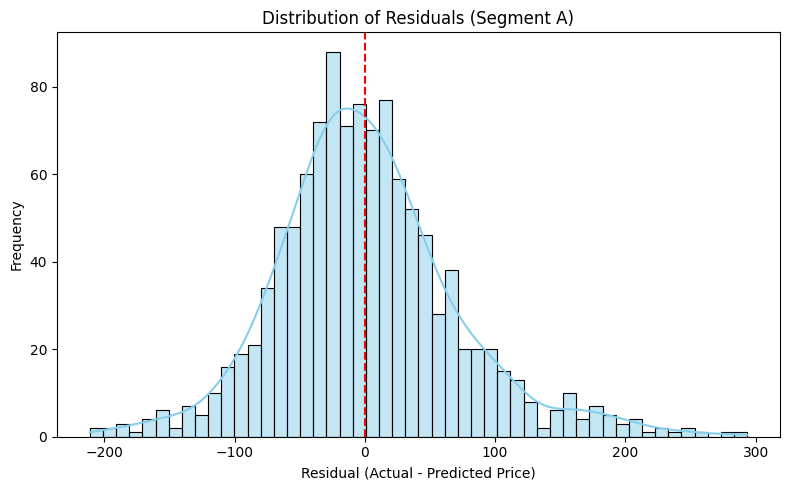

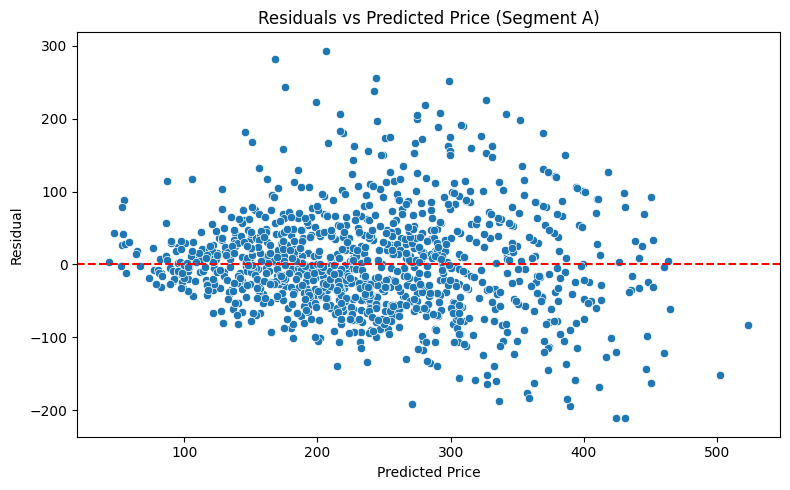

In [67]:
# Calculate residuals (Prediction Error)
residuals_low = y_low_test - y_low_test_pred

# Histogram of Residuals
plt.figure(figsize=(8, 5))
sns.histplot(residuals_low, bins=50, kde=True, color='skyblue')
plt.axvline(0, color='red', linestyle='--')
plt.title('Distribution of Residuals (Segment A)')
plt.xlabel('Residual (Actual - Predicted Price)')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

# Residuals vs Predicted
plt.figure(figsize=(8, 5))
sns.scatterplot(x=y_low_test_pred, y=residuals_low)
plt.axhline(0, color='red', linestyle='--')
plt.title('Residuals vs Predicted Price (Segment A)')
plt.xlabel('Predicted Price')
plt.ylabel('Residual')
plt.tight_layout()
plt.show()

#### Residual Visualization (Segment A)
1. Distribution of Residuals
The residuals (actual - predicted prices) form a nearly normal distribution centered around zero.
This shape indicates that the model’s errors are mostly small and evenly distributed on both sides of the actual values.

  - Conclusion: The model is not biased toward underpredicting or overpredicting in this price segment.

2. Residuals vs Predicted Prices
The residuals are randomly dispersed around the horizontal zero line.
There is no clear pattern or funnel shape, which suggests that:
The variance of errors is stable across the prediction range (no heteroscedasticity).
The model is generalizing well for this segment.

## Mapping & Label encoding

In [94]:
# Proper mapping from original data (make sure to use unencoded columns)
from sklearn.preprocessing import LabelEncoder

# Neighbourhood
le_neigh = LabelEncoder()
le_neigh.fit(df['neighbourhood_cleansed'])  # original column
neigh_map = {i: label for i, label in enumerate(le_neigh.classes_)}

# Property Type
le_property = LabelEncoder()
le_property.fit(df['property_type'])
property_map = {i: label for i, label in enumerate(le_property.classes_)}

# Room Type
le_room = LabelEncoder()
le_room.fit(df['room_type'])
room_map = {i: label for i, label in enumerate(le_room.classes_)}

# Bathrooms Text
le_bath = LabelEncoder()
le_bath.fit(df['bathrooms_text'])
bath_map = {i: label for i, label in enumerate(le_bath.classes_)}

# Print human-readable mappings
print(" Neighbourhood Mapping:", neigh_map)
print(" Property Type Mapping:", property_map)
print(" Room Type Mapping:", room_map)
print("Bathrooms Text Mapping:", bath_map)


 Neighbourhood Mapping: {0: 'Bijlmer-Centrum', 1: 'Bijlmer-Oost', 2: 'Bos en Lommer', 3: 'Buitenveldert - Zuidas', 4: 'Centrum-Oost', 5: 'Centrum-West', 6: 'De Aker - Nieuw Sloten', 7: 'De Baarsjes - Oud-West', 8: 'De Pijp - Rivierenbuurt', 9: 'Gaasperdam - Driemond', 10: 'Geuzenveld - Slotermeer', 11: 'IJburg - Zeeburgereiland', 12: 'Noord-Oost', 13: 'Noord-West', 14: 'Oostelijk Havengebied - Indische Buurt', 15: 'Osdorp', 16: 'Oud-Noord', 17: 'Oud-Oost', 18: 'Slotervaart', 19: 'Watergraafsmeer', 20: 'Westerpark', 21: 'Zuid'}
 Property Type Mapping: {0: 'Barn', 1: 'Boat', 2: 'Camper/RV', 3: 'Casa particular', 4: 'Cave', 5: 'Earthen home', 6: 'Entire cabin', 7: 'Entire chalet', 8: 'Entire condo', 9: 'Entire cottage', 10: 'Entire guest suite', 11: 'Entire guesthouse', 12: 'Entire home', 13: 'Entire loft', 14: 'Entire place', 15: 'Entire rental unit', 16: 'Entire serviced apartment', 17: 'Entire townhouse', 18: 'Entire vacation home', 19: 'Entire villa', 20: 'Houseboat', 21: 'Private roo

In [70]:
import pandas as pd

# 1. Recreate segment_a_results
segment_a_results = X_low_test.copy()
segment_a_results['Actual Price ($)'] = y_low_test
segment_a_results['Predicted Price ($)'] = y_low_test_pred
segment_a_results['Prediction Error ($)'] = y_low_test - y_low_test_pred
segment_a_results.reset_index(drop=True, inplace=True)

In [71]:
segment_a_results.columns

Index(['neighbourhood_cleansed', 'latitude', 'longitude', 'property_type',
       'room_type', 'bedrooms', 'accommodates', 'bathrooms_text', 'beds',
       'host_is_superhost', 'host_identity_verified',
       'host_total_listings_count', 'availability_30', 'availability_60',
       'availability_90', 'availability_365', 'number_of_reviews',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'reviews_per_month', 'instant_bookable',
       'minimum_nights', 'maximum_nights', 'has_Smoke alarm', 'has_Wifi',
       'has_Hot water', 'has_Kitchen', 'has_Essentials',
       'has_Dishes and silverware', 'has_Bed linens', 'has_Hair dryer',
       'has_Refrigerator', 'has_Hangers', 'has_Iron', 'has_Cooking basics',
       'has_Carbon monoxide alarm', 'has_Dedicated workspace',
       'has_Hot water kettle', 'has_Shampoo', 'has_Dishwasher

In [72]:
#  Neighbourhood Mapping
neighbourhood_mapping = {
    0: 'Bijlmer-Centrum',
    1: 'Bijlmer-Oost',
    2: 'Bos en Lommer',
    3: 'Buitenveldert - Zuidas',
    4: 'Centrum-Oost',
    5: 'Centrum-West',
    6: 'De Aker - Nieuw Sloten',
    7: 'De Baarsjes - Oud-West',
    8: 'De Pijp - Rivierenbuurt',
    9: 'Gaasperdam - Driemond',
    10: 'Geuzenveld - Slotermeer',
    11: 'IJburg - Zeeburgereiland',
    12: 'Noord-Oost',
    13: 'Noord-West',
    14: 'Oostelijk Havengebied - Indische Buurt',
    15: 'Osdorp',
    16: 'Oud-Noord',
    17: 'Oud-Oost',
    18: 'Slotervaart',
    19: 'Watergraafsmeer',
    20: 'Westerpark',
    21: 'Zuid'
}

# Apply decoding to the column
segment_a_results['Neighbourhood'] = segment_a_results['neighbourhood_cleansed'].map(neighbourhood_mapping)


In [73]:
# Replace encoded property type values with actual names
property_type_mapping = {
    0: 'Barn', 1: 'Boat', 2: 'Camper/RV', 3: 'Casa particular', 4: 'Cave', 5: 'Earthen home',
    6: 'Entire cabin', 7: 'Entire chalet', 8: 'Entire condo', 9: 'Entire cottage', 10: 'Entire guest suite',
    11: 'Entire guesthouse', 12: 'Entire home', 13: 'Entire loft', 14: 'Entire place', 15: 'Entire rental unit',
    16: 'Entire serviced apartment', 17: 'Entire townhouse', 18: 'Entire vacation home', 19: 'Entire villa',
    20: 'Houseboat', 21: 'Private room', 22: 'Private room in barn', 23: 'Private room in bed and breakfast',
    24: 'Private room in boat', 25: 'Private room in bungalow', 26: 'Private room in cabin',
    27: 'Private room in casa particular', 28: 'Private room in condo', 29: 'Private room in earthen home',
    30: 'Private room in farm stay', 31: 'Private room in guest suite', 32: 'Private room in guesthouse',
    33: 'Private room in home', 34: 'Private room in hostel', 35: 'Private room in houseboat',
    36: 'Private room in hut', 37: 'Private room in loft', 38: 'Private room in nature lodge',
    39: 'Private room in rental unit', 40: 'Private room in serviced apartment', 41: 'Private room in tiny home',
    42: 'Private room in townhouse', 43: 'Private room in vacation home', 44: 'Private room in villa',
    45: 'Room in aparthotel', 46: 'Room in bed and breakfast', 47: 'Room in boutique hotel',
    48: 'Room in hostel', 49: 'Room in hotel', 50: 'Room in serviced apartment', 51: 'Shared room in boat',
    52: 'Shared room in home', 53: 'Shared room in hostel', 54: 'Shared room in hotel',
    55: 'Shared room in houseboat', 56: 'Shared room in rental unit', 57: 'Tiny home', 58: 'Yurt'
}

segment_a_results['Property Type'] = segment_a_results['property_type'].map(property_type_mapping)


In [74]:
# Room Type mapping
room_type_mapping = {
    0: 'Entire home/apt',
    1: 'Hotel room',
    2: 'Private room',
    3: 'Shared room'
}

# Apply mapping
segment_a_results['Room Type'] = segment_a_results['room_type'].map(room_type_mapping)


In [75]:
# Bathrooms (Text) mapping
bathroom_text_mapping = {
    0: '0 baths',
    1: '0 shared baths',
    2: '1 bath',
    3: '1 private bath',
    4: '1 shared bath',
    5: '1.5 baths',
    6: '1.5 shared baths',
    7: '12 baths',
    8: '17 baths',
    9: '2 baths',
    10: '2 shared baths',
    11: '2.5 baths',
    12: '2.5 shared baths',
    13: '3 baths',
    14: '3 shared baths',
    15: '3.5 baths',
    16: '4 baths',
    17: '4 shared baths',
    18: '4.5 baths',
    19: '5 baths',
    20: '5.5 baths',
    21: '7 baths',
    22: 'Half-bath',
    23: 'Private half-bath',
    24: 'Shared half-bath',
    25: 'Unknown'
}

# Apply mapping
segment_a_results['Bathrooms (Text)'] = segment_a_results['bathrooms_text'].map(bathroom_text_mapping)


In [76]:
# Mapping dictionaries
binary_mapping = {'t': 'Yes', 'f': 'No'}

# Apply to relevant columns
segment_a_results['Superhost Status'] = segment_a_results['host_is_superhost'].map(binary_mapping)
segment_a_results['Host Identity Verified'] = segment_a_results['host_identity_verified'].map(binary_mapping)
segment_a_results['Instant Booking Available'] = segment_a_results['instant_bookable'].map(binary_mapping)


In [77]:
# List of binary amenity columns
amenity_columns = [
    'has_Smoke alarm', 'has_Wifi', 'has_Hot water',
    'has_Kitchen', 'has_Essentials', 'has_Dishes and silverware',
    'has_Bed linens', 'has_Hair dryer', 'has_Refrigerator', 'has_Hangers',
    'has_Iron', 'has_Cooking basics', 'has_Carbon monoxide alarm',
    'has_Dedicated workspace', 'has_Hot water kettle', 'has_Shampoo',
    'has_Dishwasher', 'has_Wine glasses', 'has_Heating', 'has_Dining table'
]

# Replace 1 -> 'Yes' and 0 -> 'No' for each
for col in amenity_columns:
    segment_a_results[col] = segment_a_results[col].map({1: 'Yes', 0: 'No'})


In [78]:
segment_a_results.columns


Index(['neighbourhood_cleansed', 'latitude', 'longitude', 'property_type',
       'room_type', 'bedrooms', 'accommodates', 'bathrooms_text', 'beds',
       'host_is_superhost', 'host_identity_verified',
       'host_total_listings_count', 'availability_30', 'availability_60',
       'availability_90', 'availability_365', 'number_of_reviews',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'reviews_per_month', 'instant_bookable',
       'minimum_nights', 'maximum_nights', 'has_Smoke alarm', 'has_Wifi',
       'has_Hot water', 'has_Kitchen', 'has_Essentials',
       'has_Dishes and silverware', 'has_Bed linens', 'has_Hair dryer',
       'has_Refrigerator', 'has_Hangers', 'has_Iron', 'has_Cooking basics',
       'has_Carbon monoxide alarm', 'has_Dedicated workspace',
       'has_Hot water kettle', 'has_Shampoo', 'has_Dishwasher

##  Business Insights from Segment A Model (Main Target Range)

This section summarizes pricing behaviors and actionable strategies based on the most reliable segment of listings (Segment A – listings priced ≤ €557), which form the bulk of the Amsterdam Airbnb market.


In [108]:
roomtype_avg_price = segment_a_results.groupby('Room Type')['Predicted Price ($)'].mean().sort_values(ascending=False)
print("Average Predicted Price by Room Type:")
print(roomtype_avg_price)

Average Predicted Price by Room Type:
Room Type
Entire home/apt    267.372803
Hotel room         209.492294
Private room       159.583008
Shared room        103.029739
Name: Predicted Price ($), dtype: float32


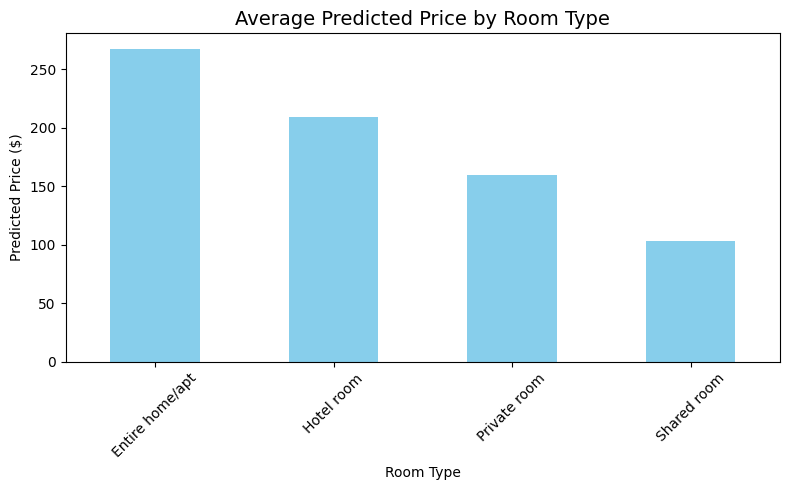

In [117]:

plt.figure(figsize=(8,5))
roomtype_avg_price.plot(kind='bar', color='skyblue')
plt.title('Average Predicted Price by Room Type', fontsize=14)
plt.ylabel('Predicted Price ($)')
plt.xlabel('Room Type')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [109]:
top_neigh = segment_a_results.groupby('Neighbourhood')['Predicted Price ($)'].mean().sort_values(ascending=False).head(3)
print("Top 3 Neighborhoods by Predicted Price:")
print(top_neigh)


Top 3 Neighborhoods by Predicted Price:
Neighbourhood
De Baarsjes - Oud-West    256.491669
Oud-Oost                  253.941849
Noord-West                252.858795
Name: Predicted Price ($), dtype: float32


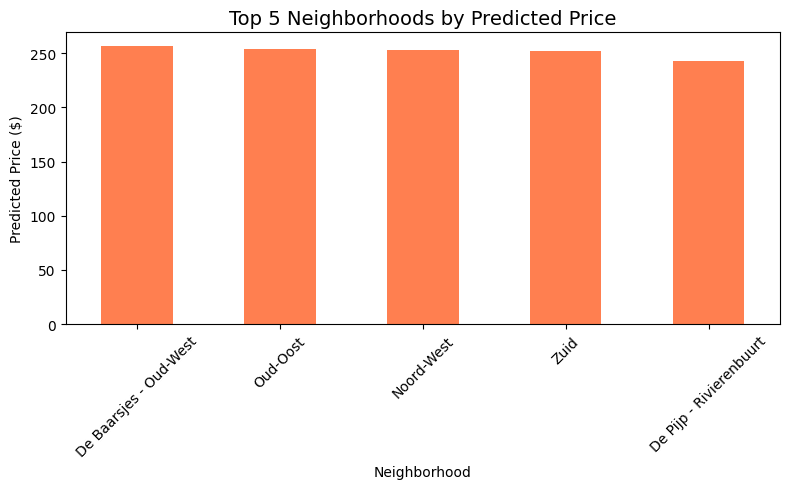

In [118]:
plt.figure(figsize=(8,5))
neigh_price.head(5).plot(kind='bar', color='coral')
plt.title('Top 5 Neighborhoods by Predicted Price', fontsize=14)
plt.ylabel('Predicted Price ($)')
plt.xlabel('Neighborhood')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [110]:
for amenity_col in ['has_Dishwasher', 'has_Wifi', 'has_Dedicated workspace']:
    uplift = segment_a_results.groupby(amenity_col)['Predicted Price ($)'].mean()
    print(f"\nAmenity Uplift – {amenity_col}:")
    print(uplift)



Amenity Uplift – has_Dishwasher:
has_Dishwasher
No     207.212357
Yes    271.055725
Name: Predicted Price ($), dtype: float32

Amenity Uplift – has_Wifi:
has_Wifi
No     250.096237
Yes    237.887085
Name: Predicted Price ($), dtype: float32

Amenity Uplift – has_Dedicated workspace:
has_Dedicated workspace
No     221.936676
Yes    253.116028
Name: Predicted Price ($), dtype: float32


In [119]:
amenity_labels = ['Dishwasher', 'Wifi', 'Dedicated Workspace']
amenity_means = [
    segment_a_results.groupby('has_Dishwasher')['Predicted Price ($)'].mean().to_dict(),
    segment_a_results.groupby('has_Wifi')['Predicted Price ($)'].mean().to_dict(),
    segment_a_results.groupby('has_Dedicated workspace')['Predicted Price ($)'].mean().to_dict()
]

for label, mean_dict in zip(amenity_labels, amenity_means):
    uplift = mean_dict.get(True, 0) - mean_dict.get(False, 0)
    print(f"{label} adds approx. ${uplift:.2f} to predicted price")


Dishwasher adds approx. $0.00 to predicted price
Wifi adds approx. $0.00 to predicted price
Dedicated Workspace adds approx. $0.00 to predicted price


In [111]:
guest_price = segment_a_results.groupby('accommodates')['Predicted Price ($)'].mean()
print("Average Predicted Price by Guest Capacity:")
print(guest_price)


Average Predicted Price by Guest Capacity:
accommodates
1     110.443047
2     198.065567
3     238.634201
4     305.611084
5     331.619568
6     320.910400
7     391.462128
8     378.363892
10    175.610275
11    441.742065
12    405.076874
14    204.743454
Name: Predicted Price ($), dtype: float32


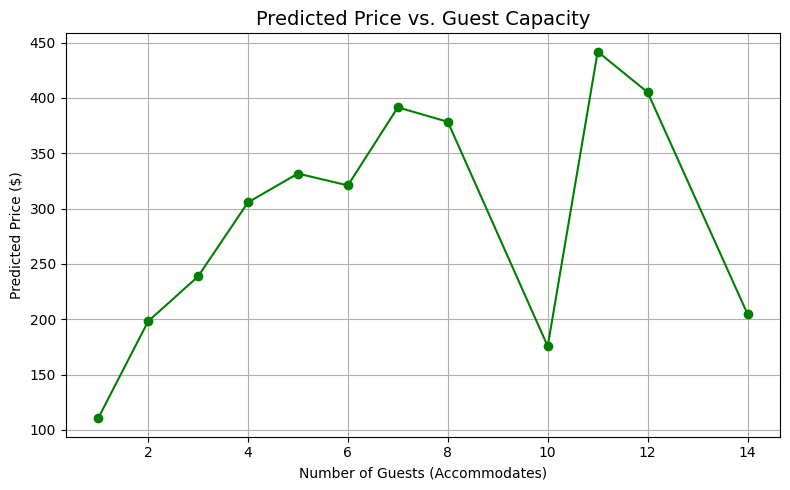

In [120]:
plt.figure(figsize=(8,5))
guest_price.plot(kind='line', marker='o', color='green')
plt.title('Predicted Price vs. Guest Capacity', fontsize=14)
plt.ylabel('Predicted Price ($)')
plt.xlabel('Number of Guests (Accommodates)')
plt.grid(True)
plt.tight_layout()
plt.show()


In [112]:
property_price = segment_a_results.groupby('Property Type')['Predicted Price ($)'].mean().sort_values(ascending=False)
print("Average Predicted Price by Property Type:")
print(property_price)


Average Predicted Price by Property Type:
Property Type
Entire guest suite                    297.747070
Entire rental unit                    296.105652
Entire vacation home                  292.920197
Private room in casa particular       278.140106
Entire guesthouse                     276.010864
Cave                                  269.866882
Entire cabin                          269.761780
Entire loft                           259.186584
Entire place                          254.825378
Boat                                  244.819168
Private room in townhouse             239.293213
Entire condo                          235.628098
Private room in vacation home         232.891129
Entire home                           226.531189
Entire serviced apartment             216.034195
Private room in home                  208.688629
Room in aparthotel                    205.629623
Entire cottage                        194.504959
Private room in nature lodge          190.529694
Private room 

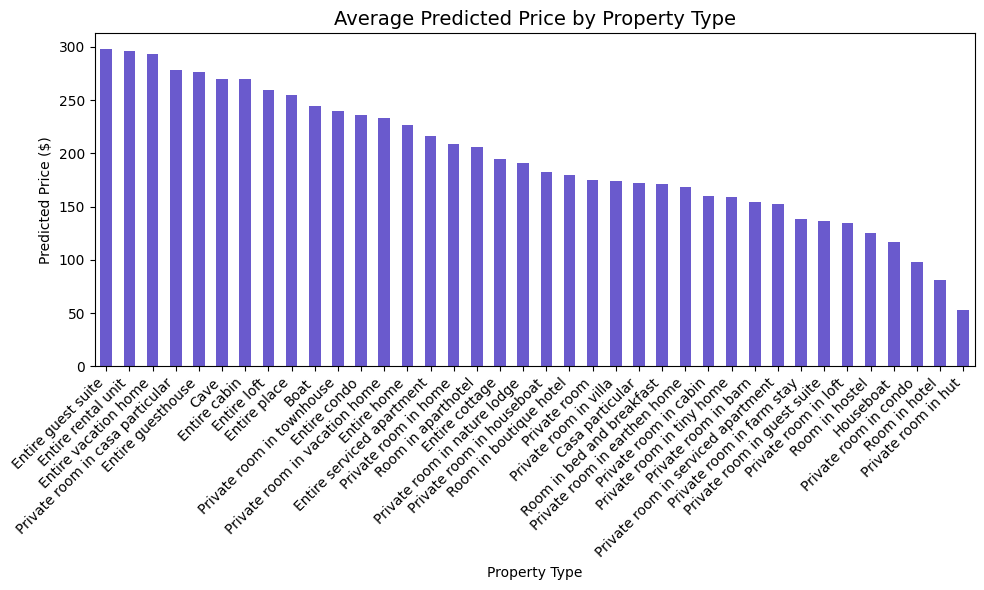

In [121]:
plt.figure(figsize=(10,6))
property_price.plot(kind='bar', color='slateblue')
plt.title('Average Predicted Price by Property Type', fontsize=14)
plt.ylabel('Predicted Price ($)')
plt.xlabel('Property Type')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [113]:
bathroom_price = segment_a_results.groupby('Bathrooms (Text)')['Predicted Price ($)'].mean().sort_values(ascending=False)
print("Average Predicted Price by Bathroom Type:")
print(bathroom_price)


Average Predicted Price by Bathroom Type:
Bathrooms (Text)
2.5 shared baths    390.375549
2 shared baths      389.212585
17 baths            345.120514
3 shared baths      345.092621
1.5 baths           268.343781
1 bath              238.880875
0 baths             202.927475
1 private bath      169.160599
1.5 shared baths    139.804611
0 shared baths      137.349335
1 shared bath       127.683159
3 baths             111.628525
Name: Predicted Price ($), dtype: float32


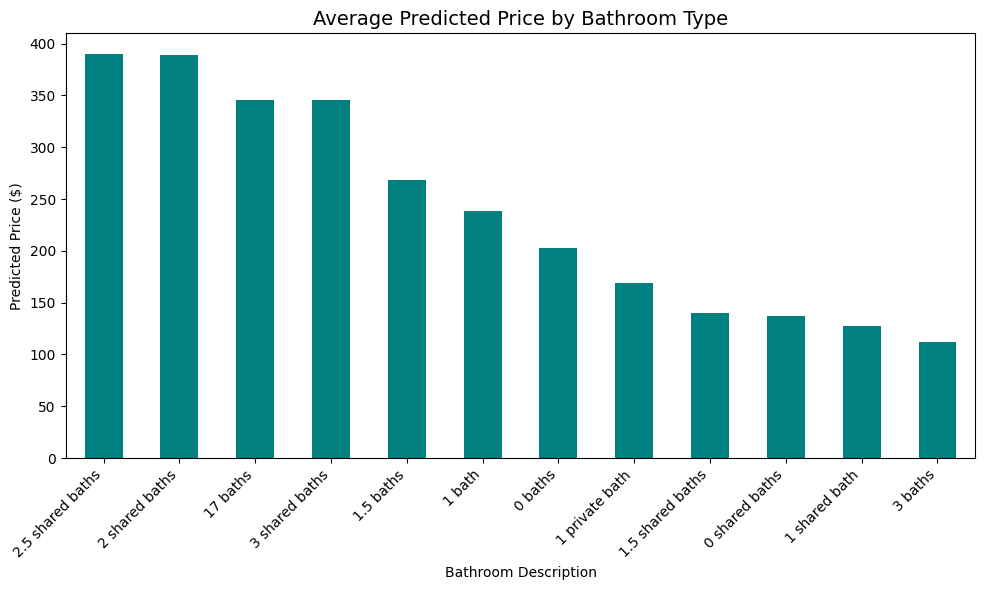

In [122]:
plt.figure(figsize=(10,6))
bathroom_price.plot(kind='bar', color='teal')
plt.title('Average Predicted Price by Bathroom Type', fontsize=14)
plt.ylabel('Predicted Price ($)')
plt.xlabel('Bathroom Description')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


## Upload to Power BI

In [80]:
# Save to CSV
segment_a_results.to_csv('SegmentA_Predictions_updated.csv', index=False)


In [124]:
segment_a_results.to_csv('SegmentA_Predictions_updated.csv', index=False)
print("CSV saved.")



CSV saved.
